In [26]:
!pip install gurobipy

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, Concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F

import gurobipy as gp
from gurobipy import GRB

# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None


# 25-26


In [28]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=21

cols = [
    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP_next', 'xP',
    'selected_by_percent','value', 'form', 'value_form', 'chance_of_playing_next_round', 'chance_of_playing_this_round',
    'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers',
    'influence', 'creativity', 'threat', 'ict_index', 'elo', 'strength',
    'strength_overall_home', 'strength_overall_away', 'strength_attack_home', 'strength_attack_away', 'strength_defence_home', 'strength_defence_away',
    'team_h_difficulty', 'team_a_difficulty', 'win_prob', 'draw_prob', 'lose_prob',


    'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    'recoveries_1', 'recoveries_3', 'recoveries_5', 'defensive_contribution_1', 'defensive_contribution_3', 'defensive_contribution_5', 'selected_by_percent_1',
    'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',


    'opp_elo', 'opp_strength']


## Data Prep


In [29]:
data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)
active_data = data_25_26[cols].copy()
pos_map = {
    'Goalkeeper': 'GK',
    '1': 'GK',
    'Defender': 'DEF',
    '2': 'DEF',
    'Midfielder': 'MID',
    '3': 'MID',
    'Forward': 'FWD',
    '4': 'FWD'
}

active_data['position'] = active_data['position'].map(pos_map)

active_data_ = active_data.copy()


active_data_['opponent_difficulty'] = active_data_.apply(
    lambda row: (row['draw_prob'] + row['lose_prob'])
    if row['was_home']
    else (row['draw_prob'] + row['win_prob']),
    axis=1
)

active_data_['team_difficulty'] = active_data_.apply(
    lambda row: (row['draw_prob'] + row['lose_prob'])
    if not row['was_home']
    else (row['draw_prob'] + row['win_prob']),
    axis=1
)



CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP_next,xP,selected_by_percent,value,form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
0,1.0,1,Raya,1.0,False,4.2,4.2,36.9,55.0,3.2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,2,Raya,1.0,True,7.5,9.0,21.5,55.0,8.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,3,Raya,1.0,False,6.5,5.5,21.8,55.0,6.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,4,Raya,1.0,True,6.0,6.5,23.5,55.0,6.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,4.0,24.0,55.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6629,788.0,21,Kukonki,14.0,False,-0.5,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6630,789.0,21,Merrick,7.0,False,0.0,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6631,790.0,21,Williams-Barnett,18.0,False,0.0,0.0,0.0,45.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6632,791.0,21,Taty,19.0,True,1.9,1.9,0.0,55.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


### Functions


In [30]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    if 'team_difficulty' not in cols_:
        cols_.append('team_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name']
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['opponent_difficulty' , 'team_difficulty' , 'was_home'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X = data_[X_cols].fillna(0).values.astype(np.float32)
    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values

    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols

def transform_data(final_df, cols, gw):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = gw - 1
    train_mask = GW_full <= GW_TRAIN_END
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw = X_full[test_mask], M_full[test_mask], Y_full[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names), GW_full, X_cols#, scaler_x, scaler_m

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.001

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)

    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='relu', name='Affine_Cond_1')([x, M_input])

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y, activation='linear', name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Pred_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


## Predictions


### GW 16


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 5.3846 - mae: 1.7337 - mse: 5.1367 - val_loss: 2.6687 - val_mae: 1.2393 - val_mse: 2.4208
Epoch 2/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0130 - mae: 1.2993 - mse: 2.7651 - val_loss: 1.6621 - val_mae: 0.9218 - val_mse: 1.4143
Epoch 3/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7863 - mae: 0.9295 - mse: 1.5385 - val_loss: 1.1890 - val_mae: 0.7464 - val_mse: 0.9412
Epoch 4/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.1408 - mae: 0.7278 - mse: 0.8931 - val_loss: 0.9598 - val_mae: 0.6542 - val_mse: 0.7124
Epoch 5/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8652 - mae: 0.5973 - mse: 0.6180 - val_loss: 0.8204 - val_mae: 0.5876 - val_mse: 0.5737
Epoch 6/10
115/115 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.6861 - mae: 0.5144 - mse: 0.4396 - val_loss: 0.7311 - val_mae: 0.5374 - val_mse: 0.4854
Ep

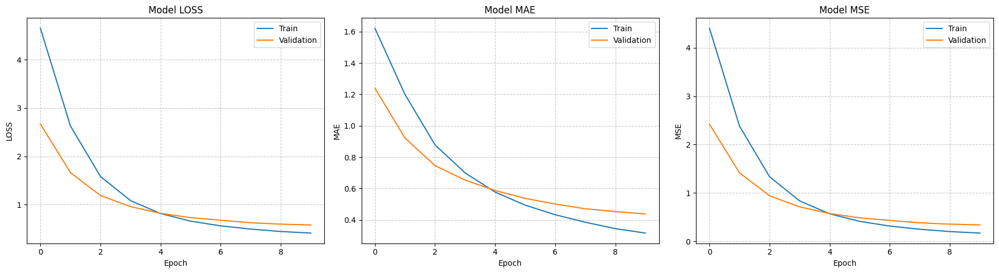


--- Final Test Set Evaluation (GW 16) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Evaluating test set performance...{'loss': 0.6445883512496948, 'mae': 0.46834999322891235, 'mse': 0.4043295979499817}
R²: 0.8864597902350424
MAE: 0.4683499932289124
MSE: 0.4043295979499817
Loss: 0.6445883512496948

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 16 ---
 Gameweek      Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       16       Foden       11.9         11.87       0.78     -0.80
       16 B.Fernandes        9.6          9.03       0.75     -0.81
       16      Wilson        8.8          8.66       0.82     -0.69
       16      Rogers        8.2          8.07       0.72     -0.58
       16     Haaland        7.1          7.73       0.78     -0.80
       16    Chalobah        7.2          7.52       1.15     -1.13
       16      Cherki        6.3          7.14       0.78     -0.80
       16      Merino  

In [31]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 16)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_16 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_16.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_16 = model_16.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 16) ---")
test_result_16 = model_16.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_16, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_16}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_16 = model_16.predict([X_test_scaled, M_test_scaled]).flatten()


position_16 = active_data['position'][test_mask]
teams_16 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_16, 'team': teams_16, 'position': position_16}
preds_df_16 = pd.DataFrame(players_preds)

# Results
results_df_16 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_16,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 16 ---")
print(results_df_16.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


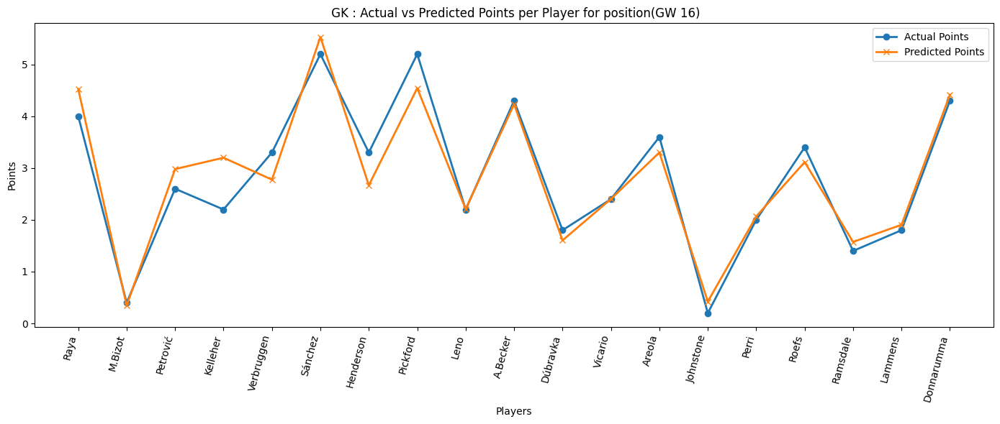

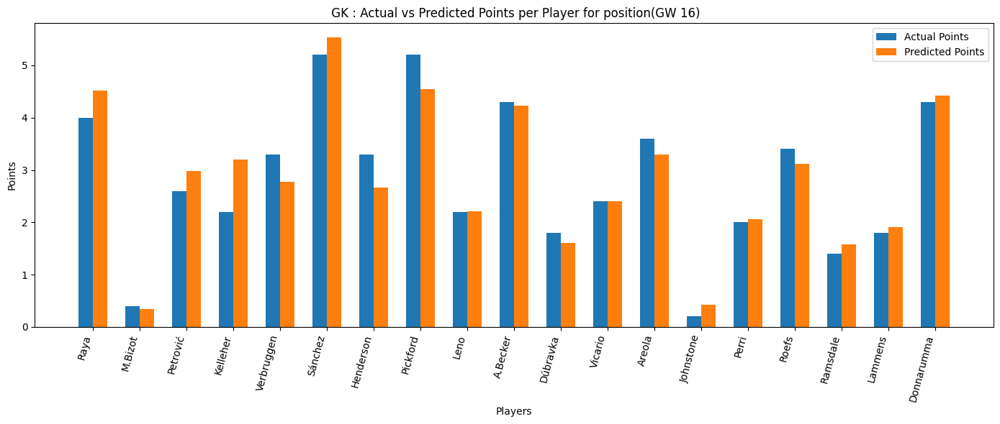

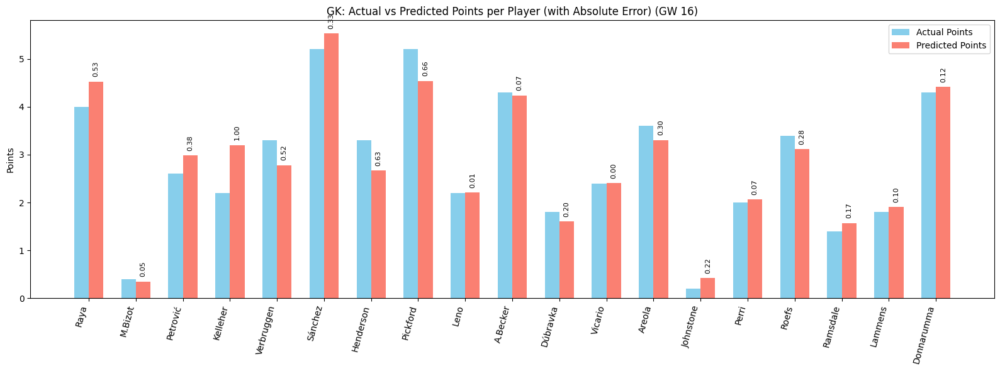

In [32]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


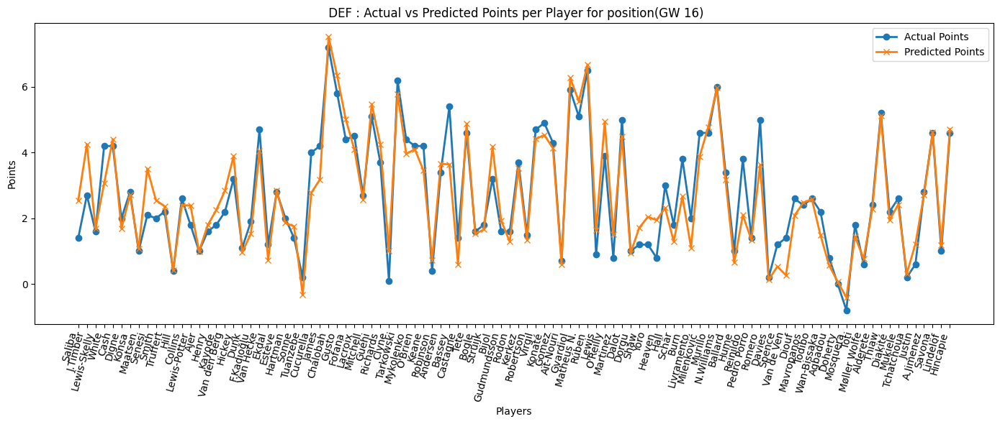

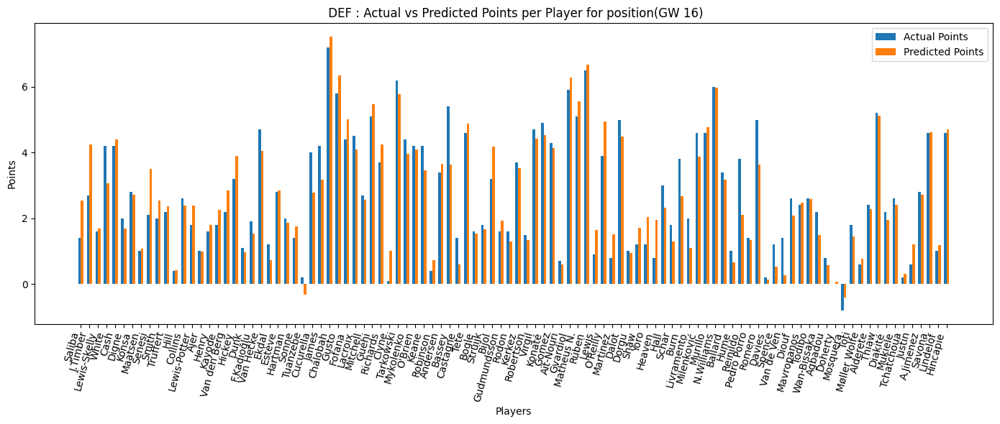

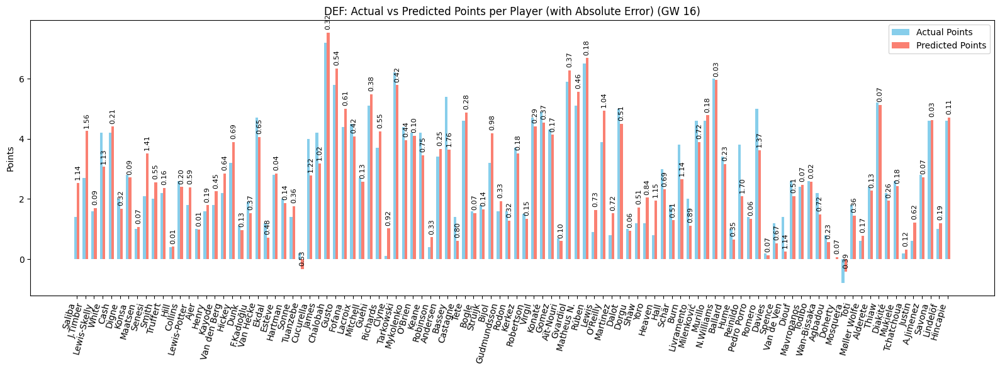

In [33]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


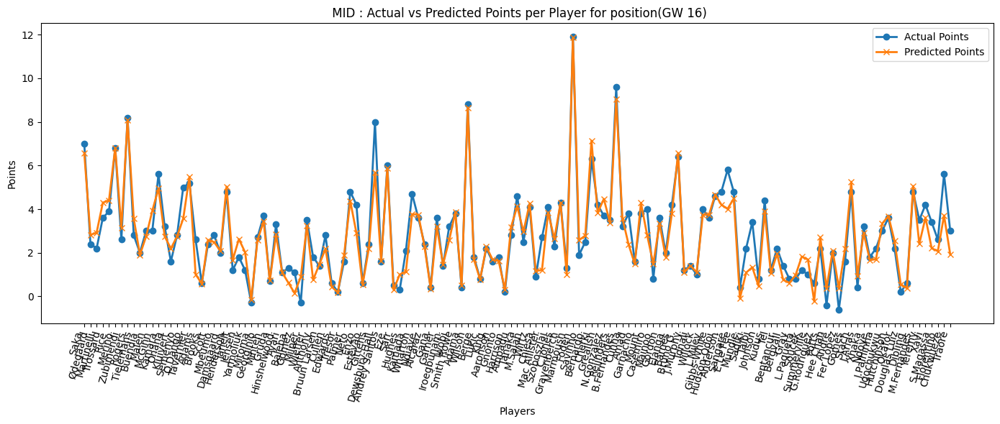

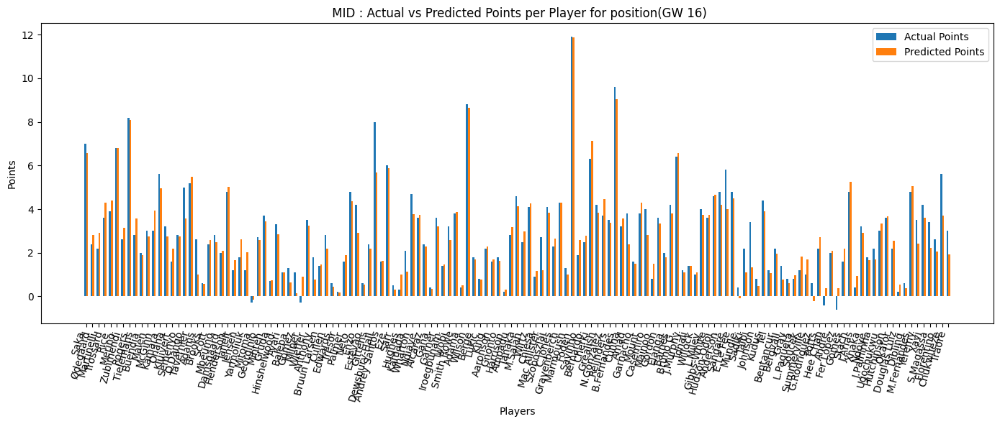

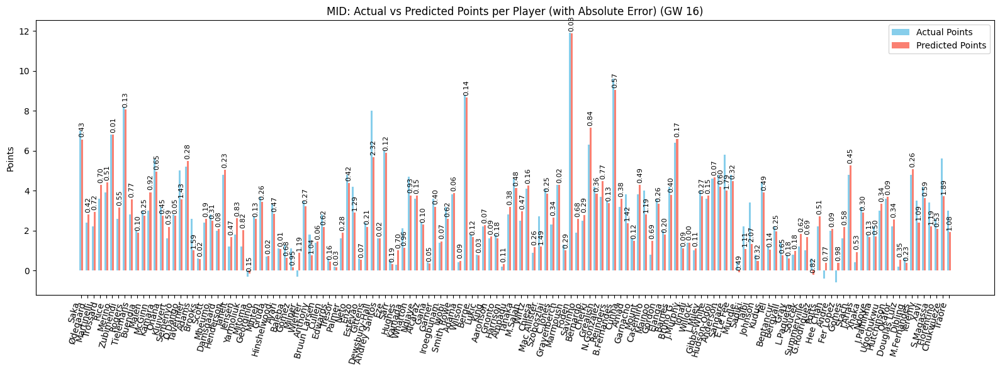

In [34]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


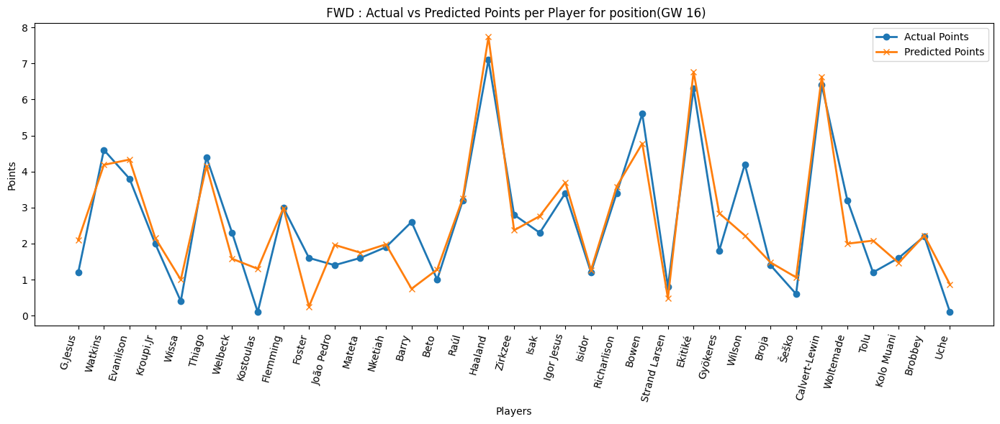

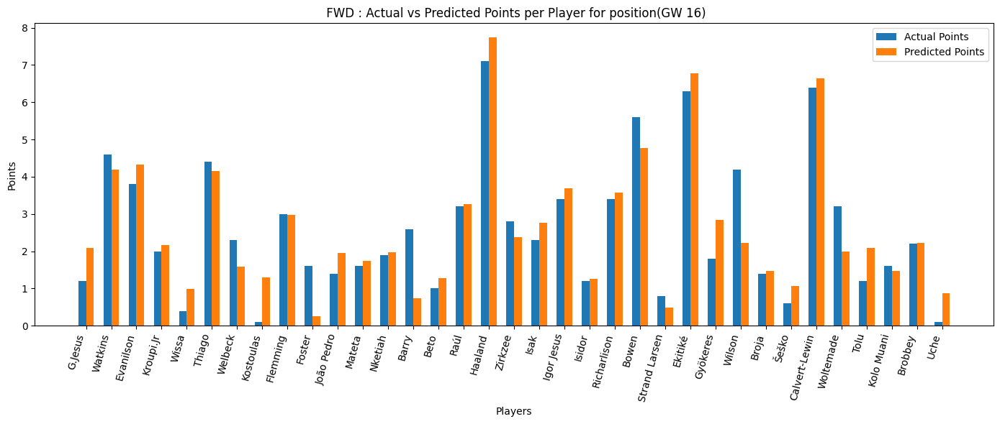

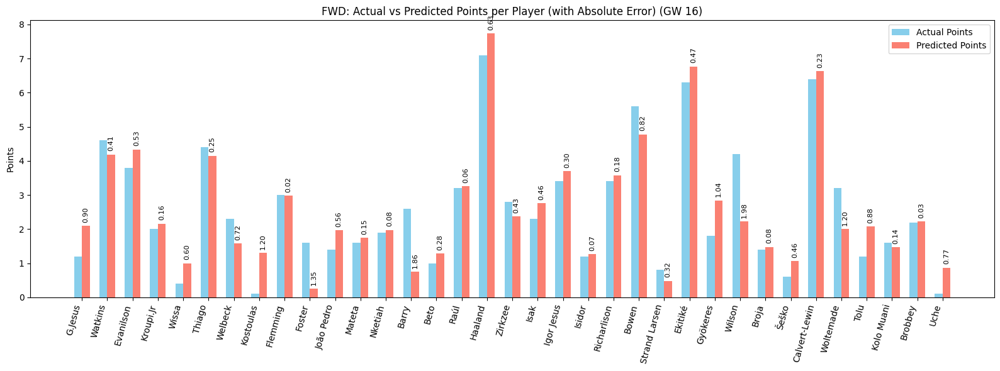

In [35]:
plot_preds(preds_df_16, 'FWD', 16)

### GW 17


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 5.8537 - mae: 1.7898 - mse: 5.6086 - val_loss: 2.2806 - val_mae: 1.1223 - val_mse: 2.0356
Epoch 2/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.6930 - mae: 1.2377 - mse: 2.4482 - val_loss: 1.4604 - val_mae: 0.8671 - val_mse: 1.2160
Epoch 3/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.3482 - mae: 0.8299 - mse: 1.1039 - val_loss: 1.1138 - val_mae: 0.7343 - val_mse: 0.8700
Epoch 4/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8983 - mae: 0.6282 - mse: 0.6547 - val_loss: 0.9348 - val_mae: 0.6520 - val_mse: 0.6918
Epoch 5/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6976 - mae: 0.5180 - mse: 0.4549 - val_loss: 0.8155 - val_mae: 0.5854 - val_mse: 0.5736
Epoch 6/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5651 - mae: 0.4377 - mse: 0.3235 - val_loss: 0.7465 - val_mae: 0.5426 - val_mse: 0.5057
Ep

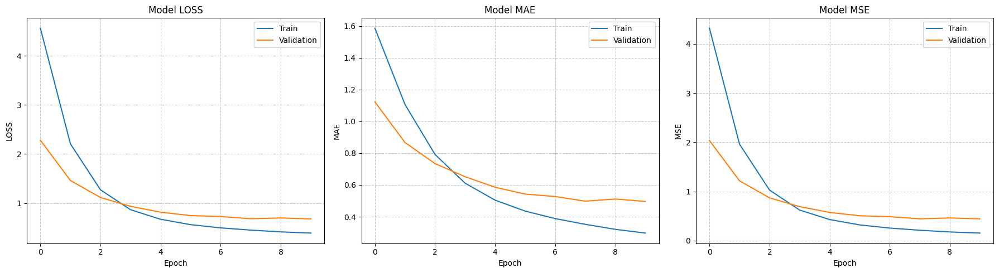


--- Final Test Set Evaluation (GW 17) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Evaluating test set performance...{'loss': 0.5507379770278931, 'mae': 0.4031735062599182, 'mse': 0.3156278133392334}
R²: 0.91663879430860440
MAE: 0.40317350625991821
MSE: 0.31562781333923340
Loss: 0.55073797702789307

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 17 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       17         Foden       12.1         11.23       1.65     -2.38
       17       Haaland        9.9          9.79       1.65     -2.38
       17 Calvert-Lewin        8.8          8.41       0.18      0.07
       17       Ekitiké        7.9          8.19       0.61     -0.58
       17        Wilson        8.8          8.10       0.36     -0.10
       17        Rogers        8.2          8.01       0.53     -0.43
       17          Saka        6.8          7.07       1.24     -1.32
    

In [36]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 17)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_17 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_17.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_17 = model_17.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 17) ---")
test_result_17 = model_17.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_17, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_17}")
print(f"R²: {evaluation_metrics['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics['test_loss']:.17f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_17 = model_17.predict([X_test_scaled, M_test_scaled]).flatten()


position_17 = active_data['position'][test_mask]
teams_17 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_17, 'team': teams_17, 'position': position_17}
preds_df_17 = pd.DataFrame(players_preds)

# Results
results_df_17 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_17,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 17 ---")
print(results_df_17.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


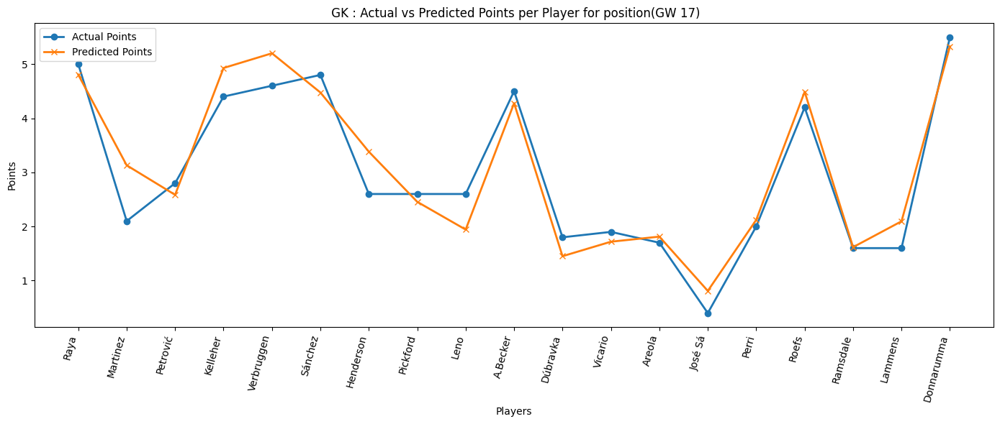

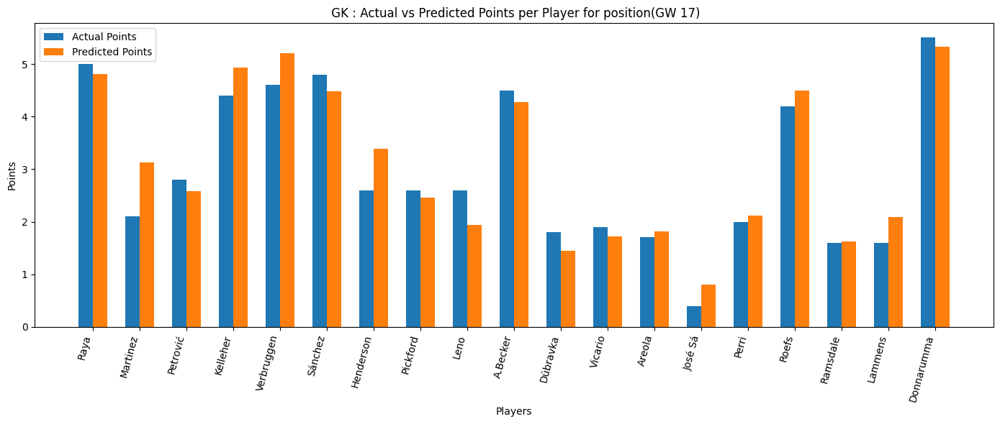

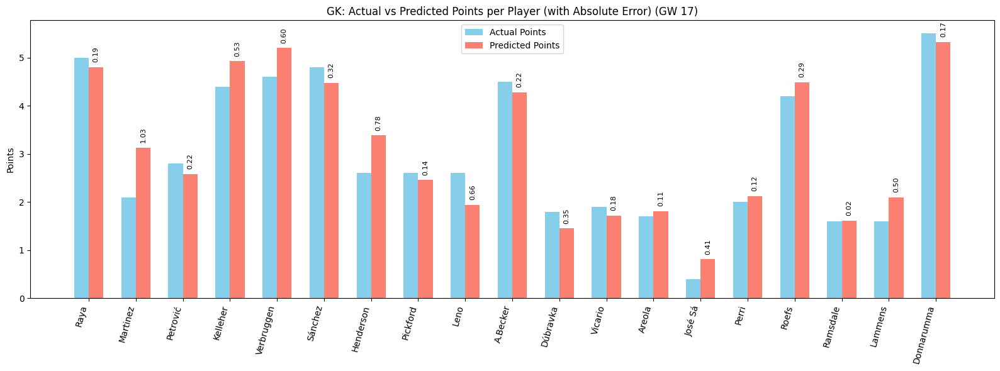

In [37]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


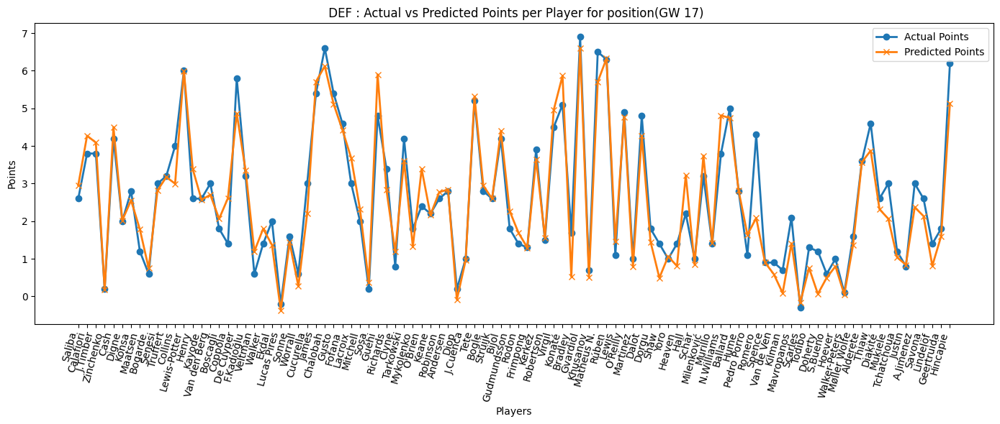

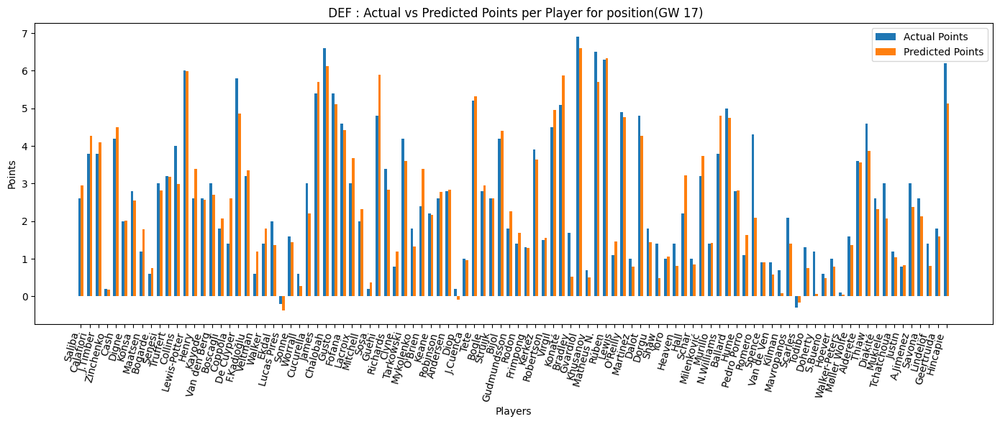

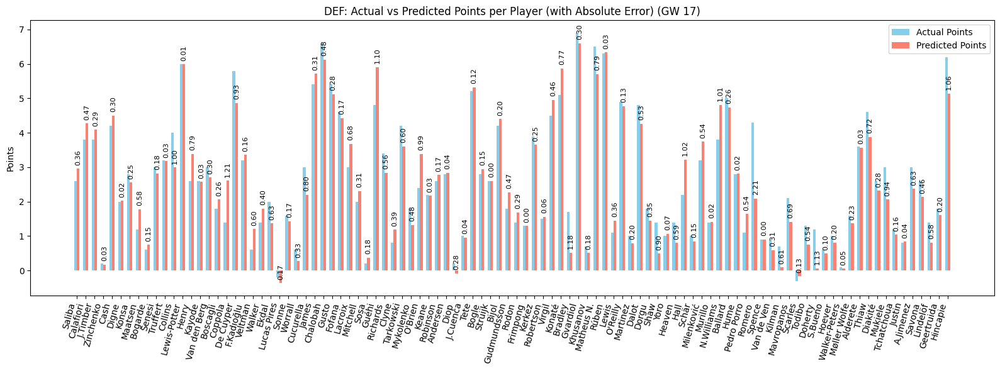

In [38]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


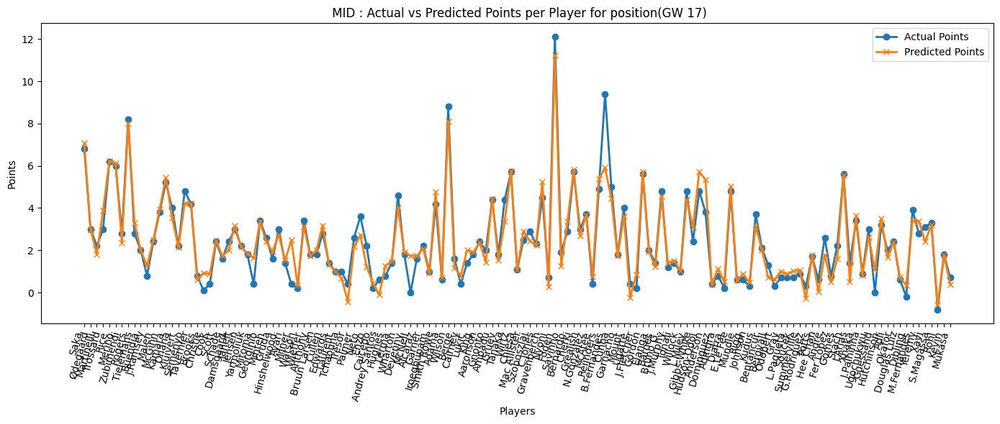

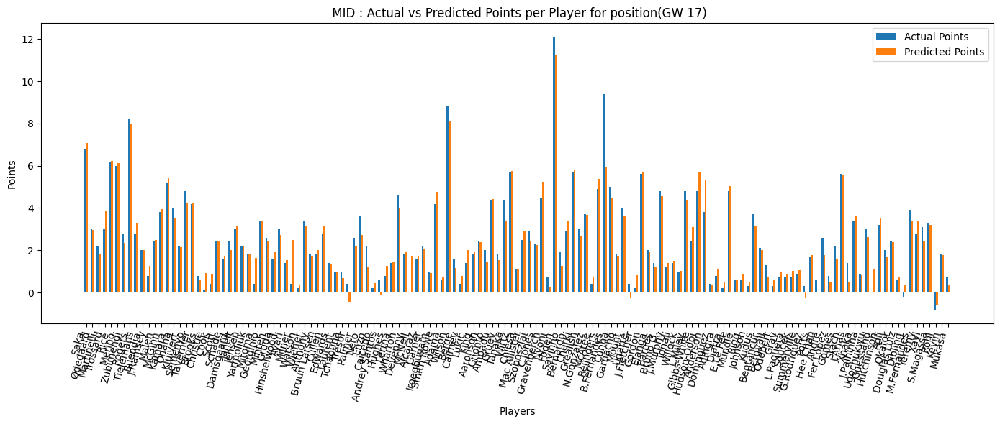

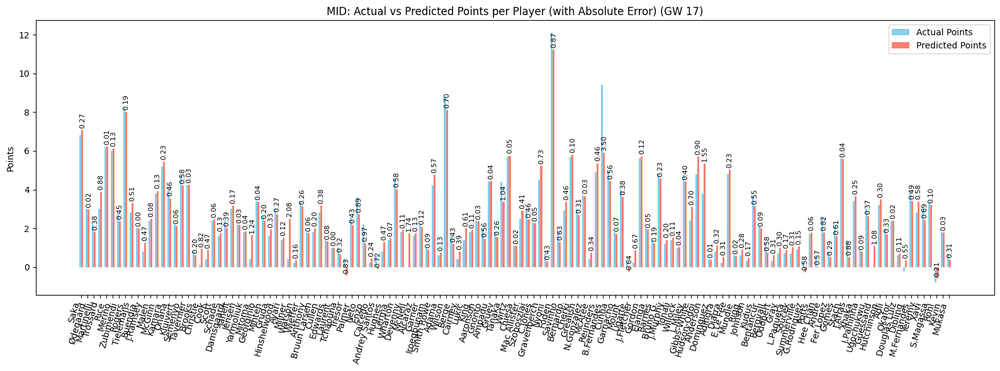

In [39]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


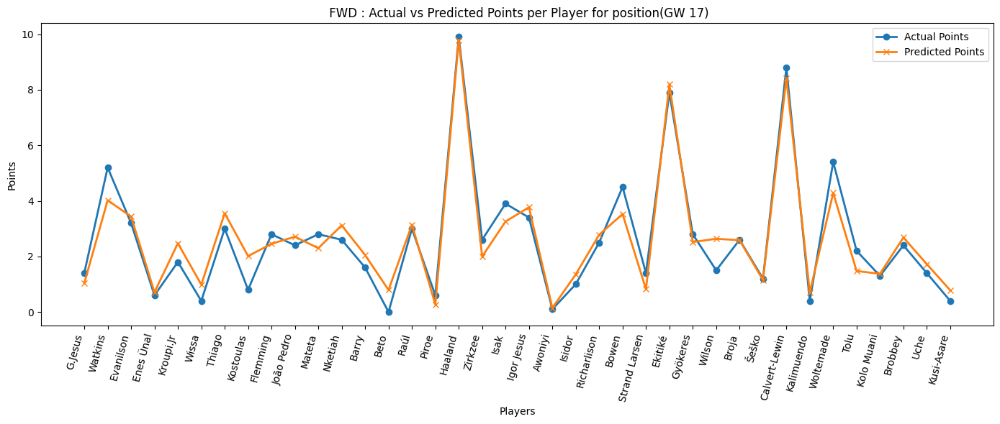

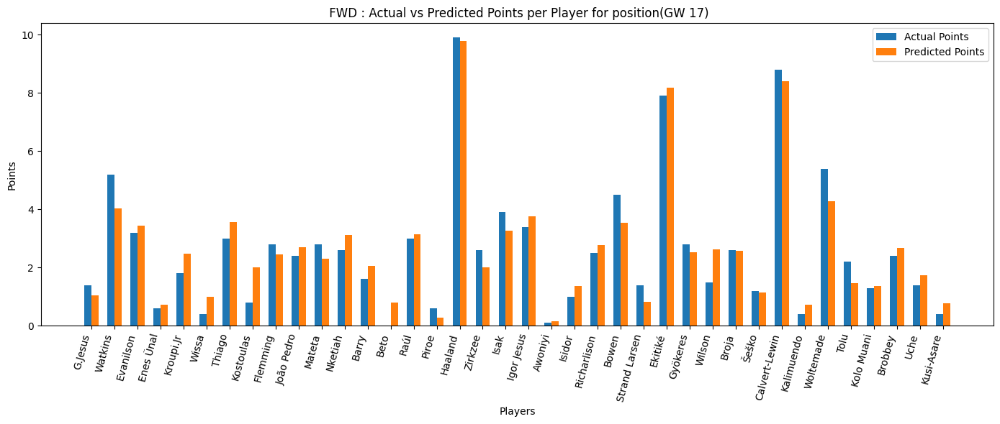

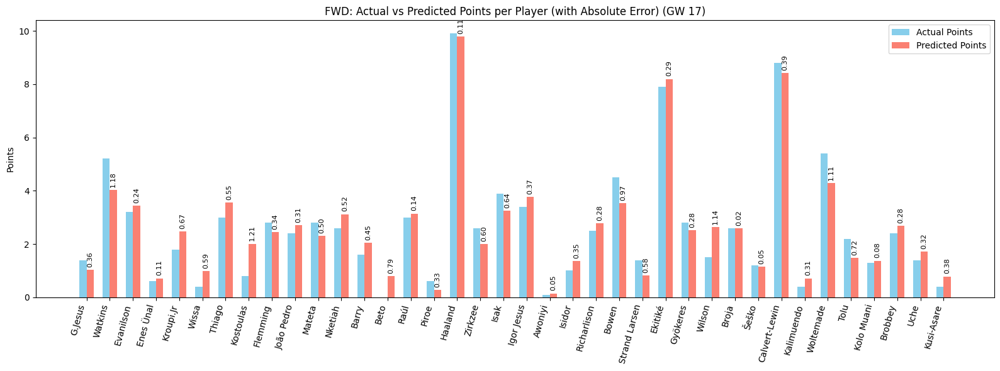

In [40]:
plot_preds(preds_df_17, 'FWD', 17)

### GW 18


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.1120 - mae: 1.9667 - mse: 6.8661 - val_loss: 2.5230 - val_mae: 1.1719 - val_mse: 2.2771
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4742 - mae: 1.1478 - mse: 2.2283 - val_loss: 1.5585 - val_mae: 0.8884 - val_mse: 1.3128
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2213 - mae: 0.7605 - mse: 0.9757 - val_loss: 1.1187 - val_mae: 0.7289 - val_mse: 0.8737
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8605 - mae: 0.5900 - mse: 0.6158 - val_loss: 0.9405 - val_mae: 0.6498 - val_mse: 0.6966
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.6529 - mae: 0.4853 - mse: 0.4094 - val_loss: 0.8277 - val_mae: 0.5894 - val_mse: 0.5852
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5550 - mae: 0.4174 - mse: 0.3128 - val_loss: 0.7784 - val_mae: 0.5627 - val_mse: 0.5373
Ep

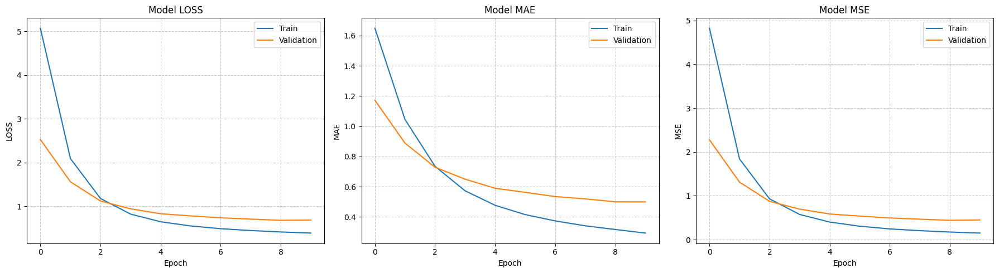


--- Final Test Set Evaluation (GW 18) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Evaluating test set performance...{'loss': 0.5557960271835327, 'mae': 0.4149101674556732, 'mse': 0.3193820118904114}
R²: 0.905458008717815899
MAE: 0.414910167455673218
MSE: 0.319382011890411377
Loss: 0.555796027183532715

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 18 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       18       Haaland        9.9          9.57       1.09     -1.25
       18 Calvert-Lewin        9.0          8.81       0.02      0.31
       18         Foden        9.5          8.48       1.09     -1.25
       18      Gvardiol        7.3          7.48       1.09     -1.25
       18        Wilson        5.8          7.18       0.10      0.08
       18          Rice        6.2          7.08       1.41     -1.68
       18        Rogers        7.0          6.91      -0.84      0.82


In [41]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 18)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_18 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_18.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_18 = model_18.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 18) ---")
test_result_18 = model_18.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_18, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_18}")
print(f"R²: {evaluation_metrics['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics['test_loss']:.18f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_18 = model_18.predict([X_test_scaled, M_test_scaled]).flatten()


position_18 = active_data['position'][test_mask]
teams_18 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_18, 'team': teams_18, 'position': position_18}
preds_df_18 = pd.DataFrame(players_preds)

# Results
results_df_18 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_18,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 18 ---")
print(results_df_18.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


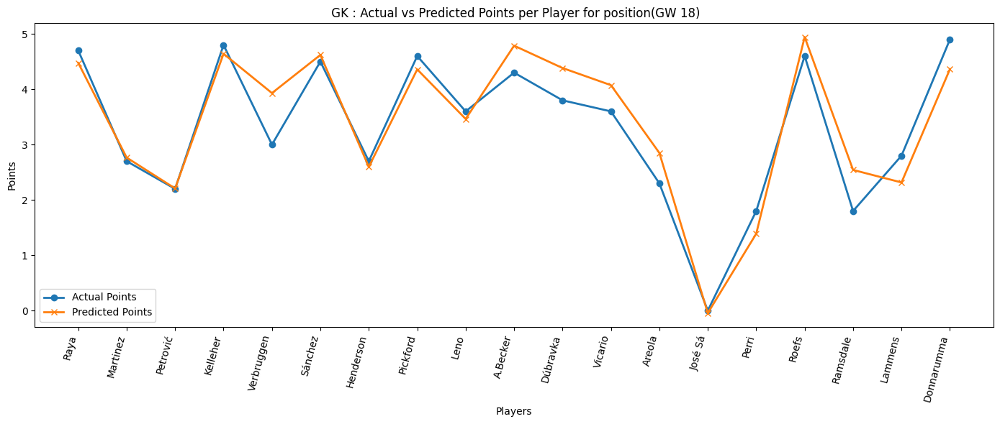

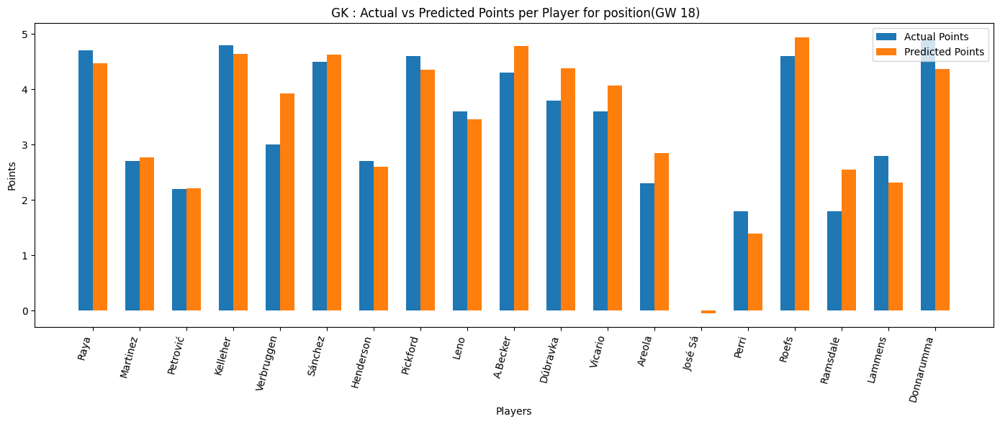

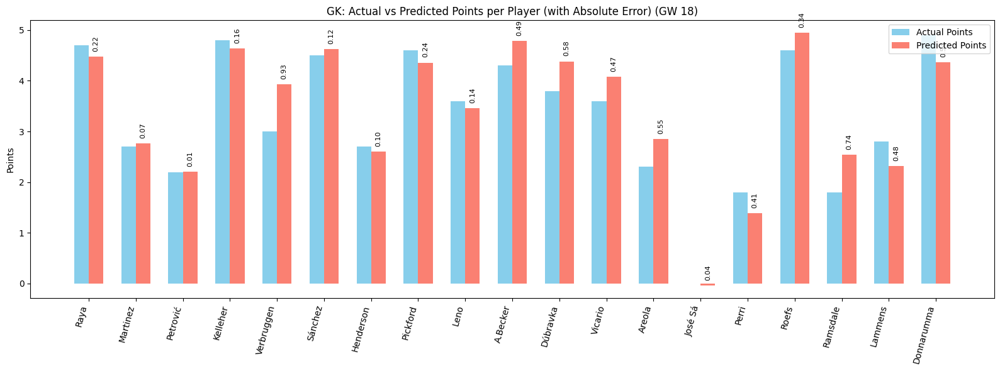

In [42]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


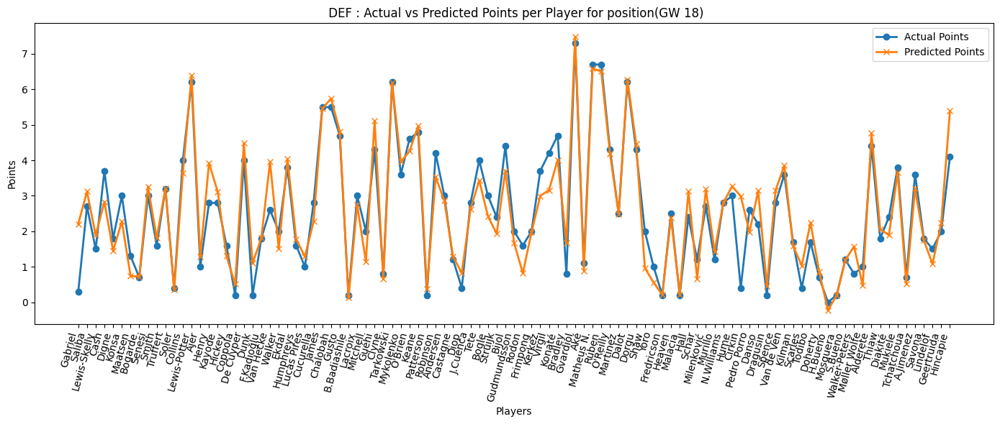

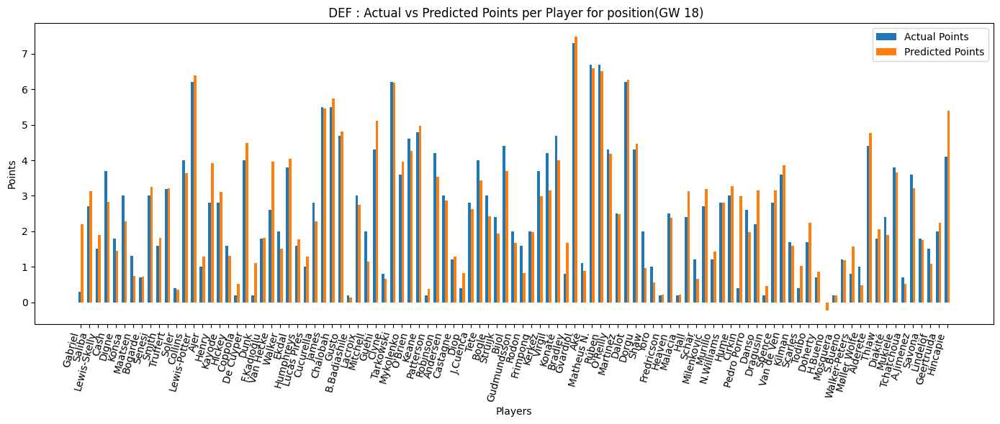

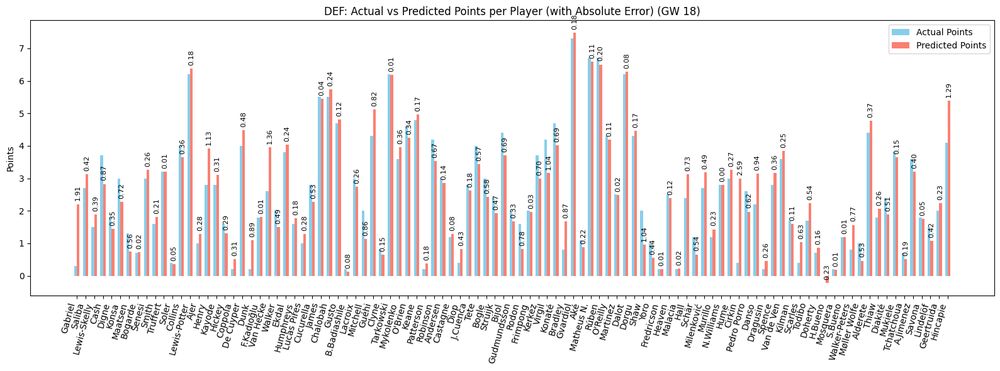

In [43]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


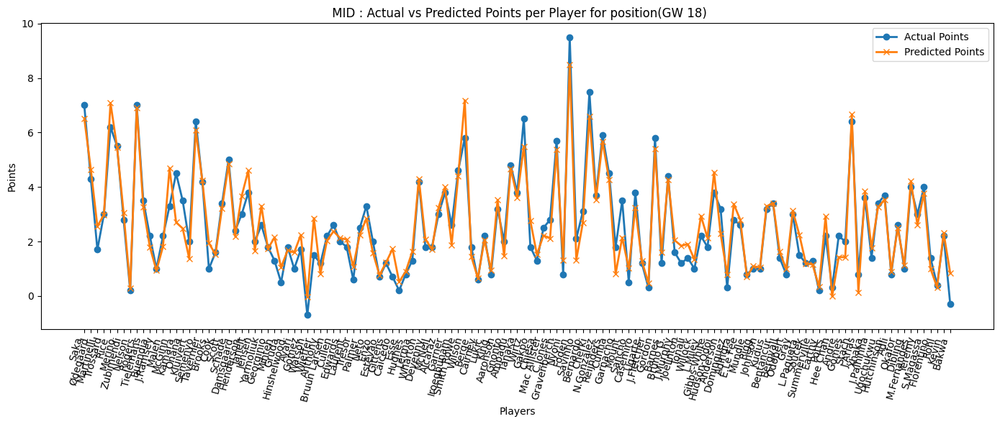

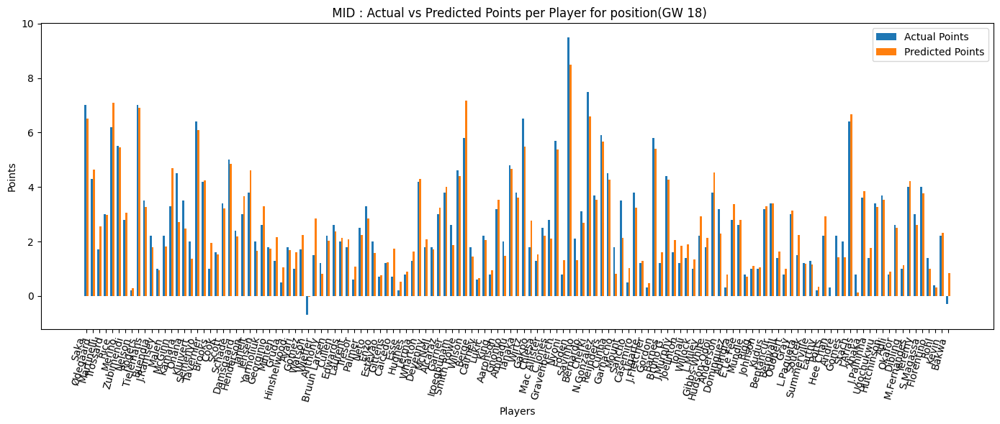

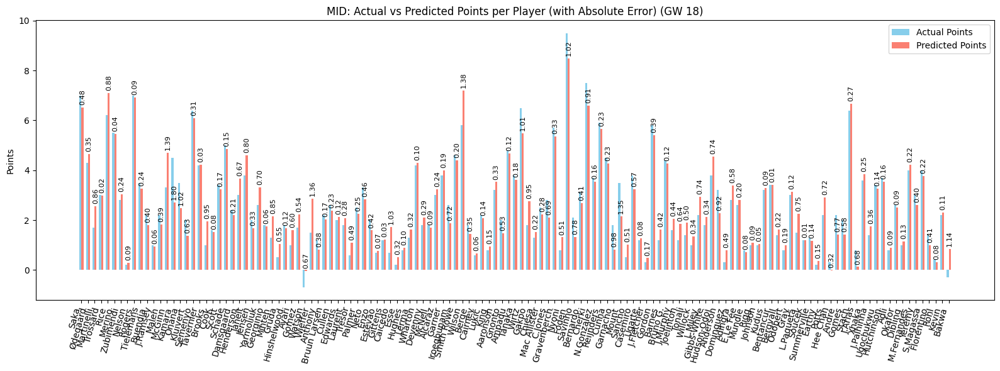

In [44]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


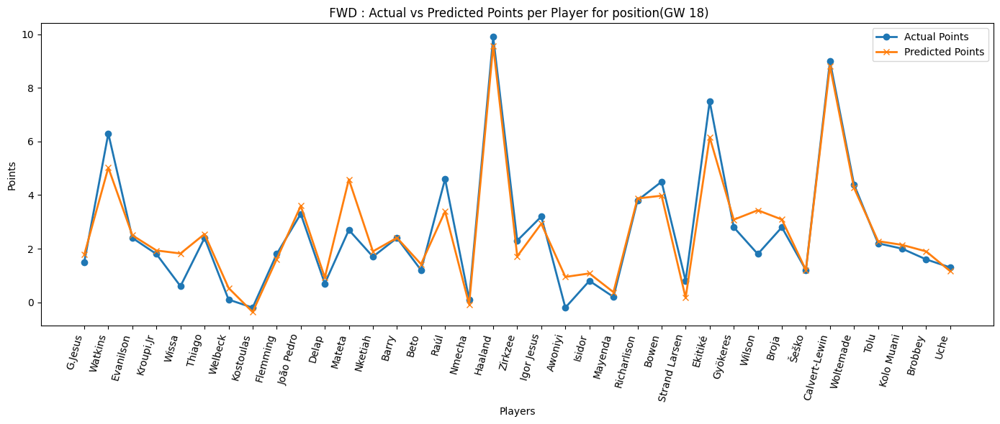

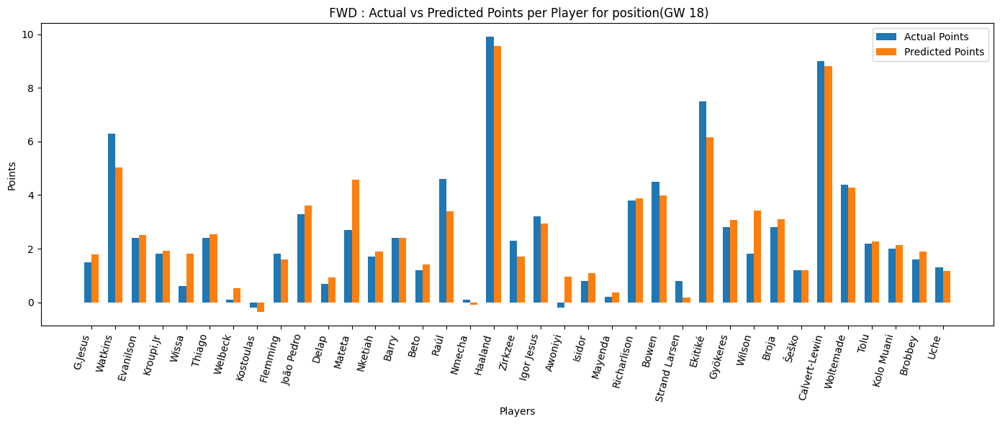

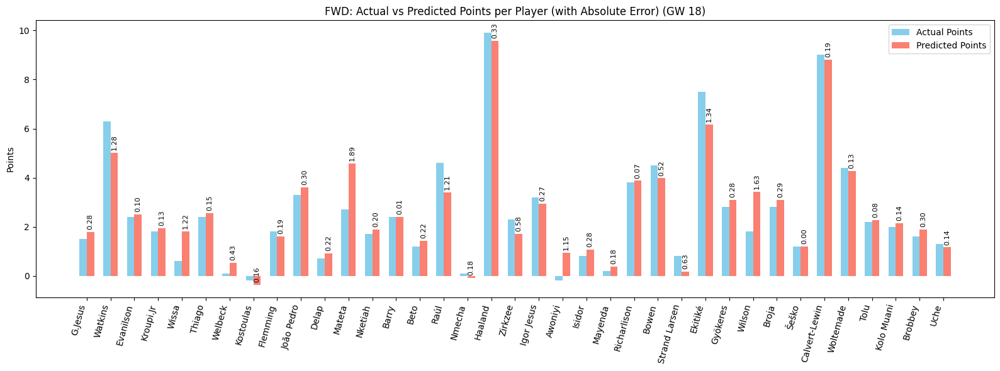

In [45]:
plot_preds(preds_df_18, 'FWD', 18)

### GW 19


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 8.2592 - mae: 2.1483 - mse: 8.0117 - val_loss: 2.5638 - val_mae: 1.2176 - val_mse: 2.3160
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.8378 - mae: 1.2502 - mse: 2.5900 - val_loss: 1.5594 - val_mae: 0.9156 - val_mse: 1.3116
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.5775 - mae: 0.8863 - mse: 1.3297 - val_loss: 1.0669 - val_mae: 0.7143 - val_mse: 0.8193
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.9229 - mae: 0.6291 - mse: 0.6754 - val_loss: 0.8597 - val_mae: 0.6213 - val_mse: 0.6128
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.7079 - mae: 0.5194 - mse: 0.4611 - val_loss: 0.7558 - val_mae: 0.5614 - val_mse: 0.5097
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.5709 - mae: 0.4327 - mse: 0.3250 - val_loss: 0.7001 - val_mae: 0.5273 - val_mse: 0.4552
Ep

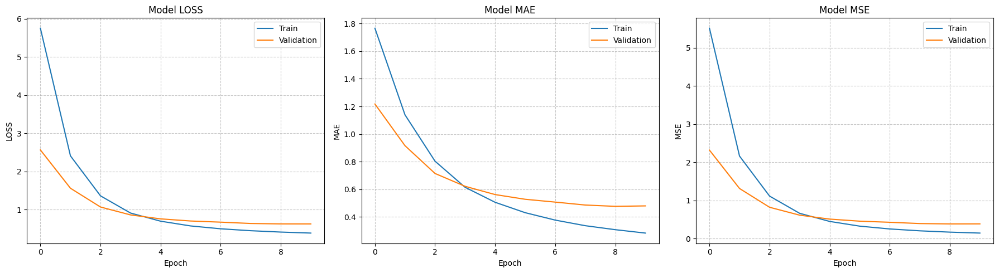


--- Final Test Set Evaluation (GW 19) ---

Evaluating test set performance...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Evaluating test set performance...{'loss': 0.5848459005355835, 'mae': 0.445533812046051, 'mse': 0.34575921297073364}
R²: 0.9000847099412510044
MAE: 0.4455338120460510254
MSE: 0.3457592129707336426
Loss: 0.5848459005355834961

Generating Predictions...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 19 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       19        Cherki        8.5          8.39       1.47     -1.76
       19       Ekitiké        8.9          8.31       1.19     -1.39
       19    Matheus N.        8.5          8.05       1.47     -1.76
       19         Rúben        7.9          7.56       1.47     -1.76
       19       Haaland        7.5          7.53       1.47     -1.76
       19      Gvardiol        7.5          6.88       1.47     -1.76
       19        Garner        6.4          6.71      -0.44      0.71


In [46]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 19)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_19 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_19.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_19 = model_19.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 19) ---")
test_result_19 = model_19.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_19, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_19}")
print(f"R²: {evaluation_metrics['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics['test_loss']:.19f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_19 = model_19.predict([X_test_scaled, M_test_scaled]).flatten()


position_19 = active_data['position'][test_mask]
teams_19 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_19, 'team': teams_19, 'position': position_19}
preds_df_19 = pd.DataFrame(players_preds)

# Results
results_df_19 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_19,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 19 ---")
print(results_df_19.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


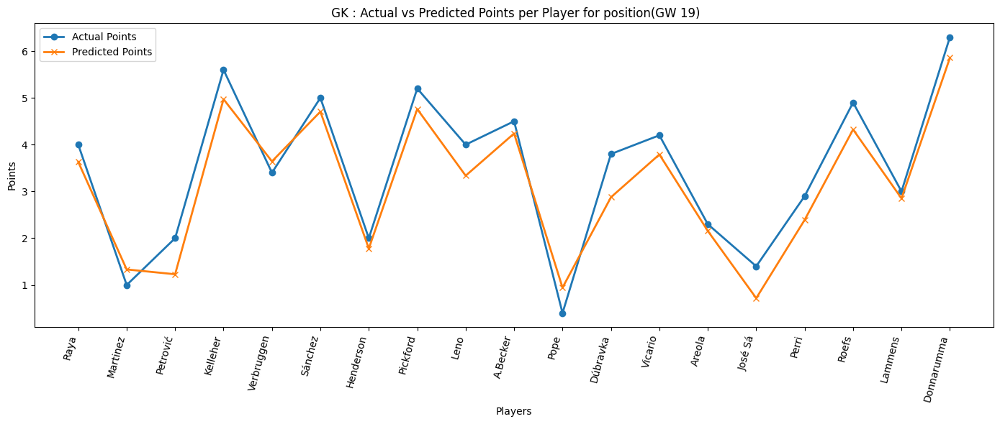

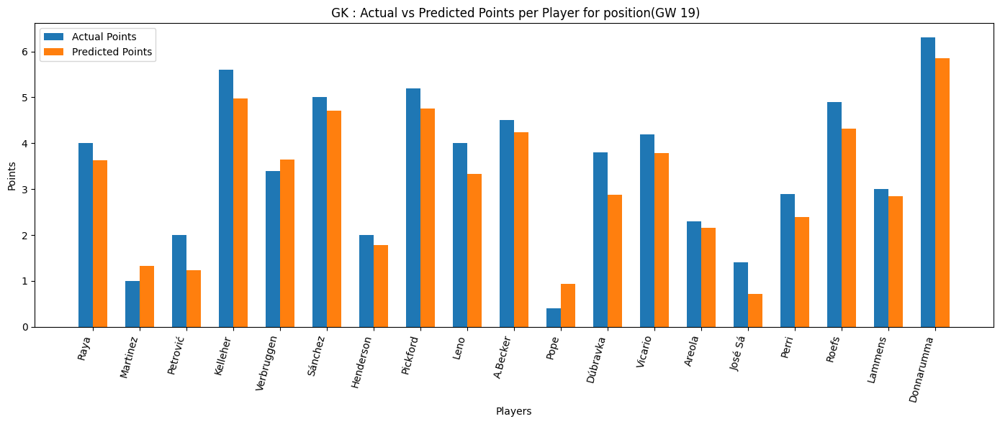

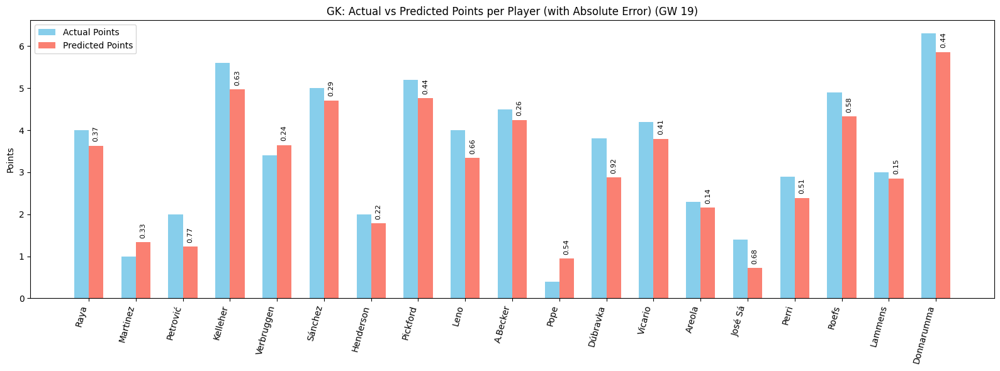

In [47]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


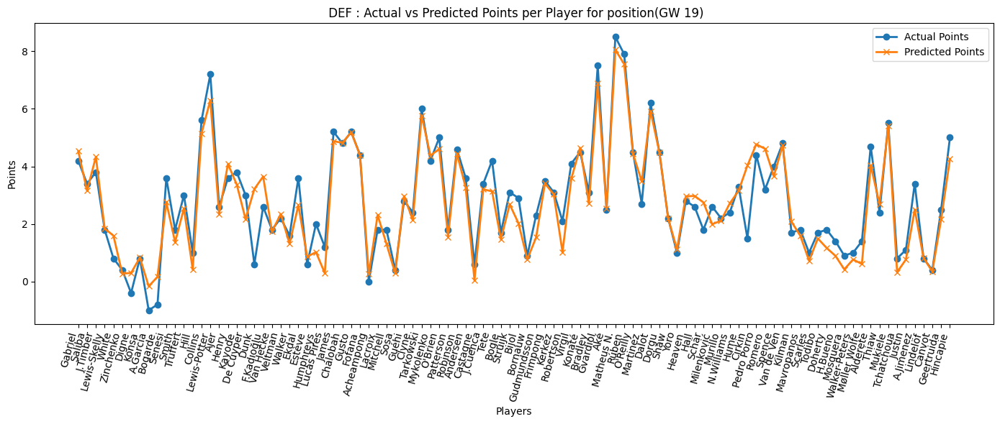

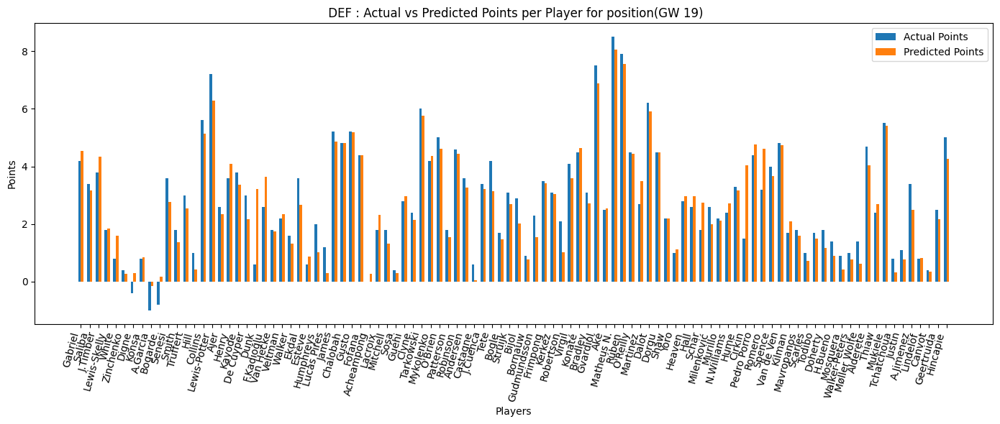

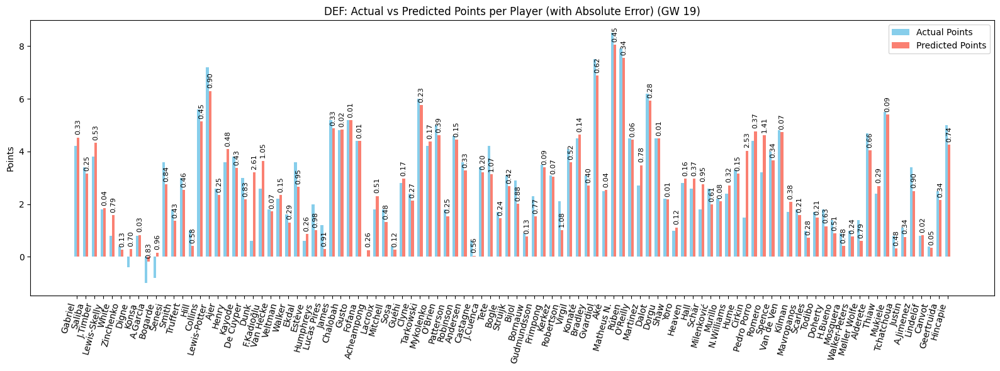

In [48]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


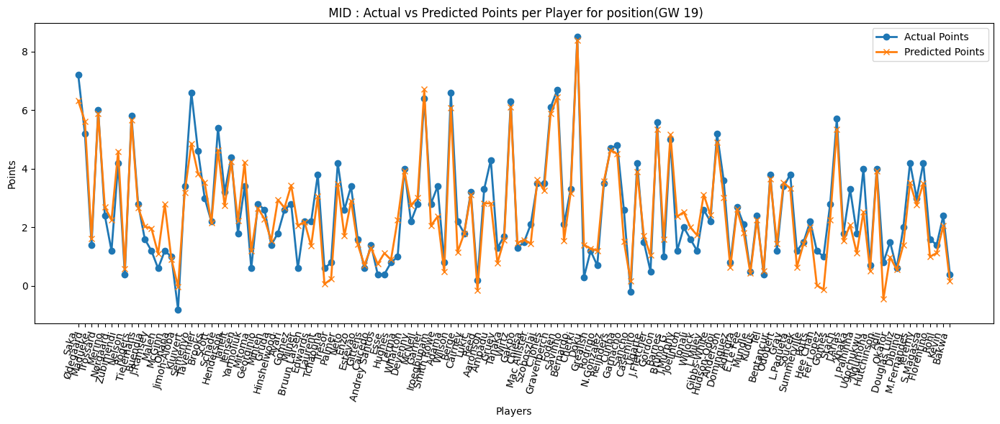

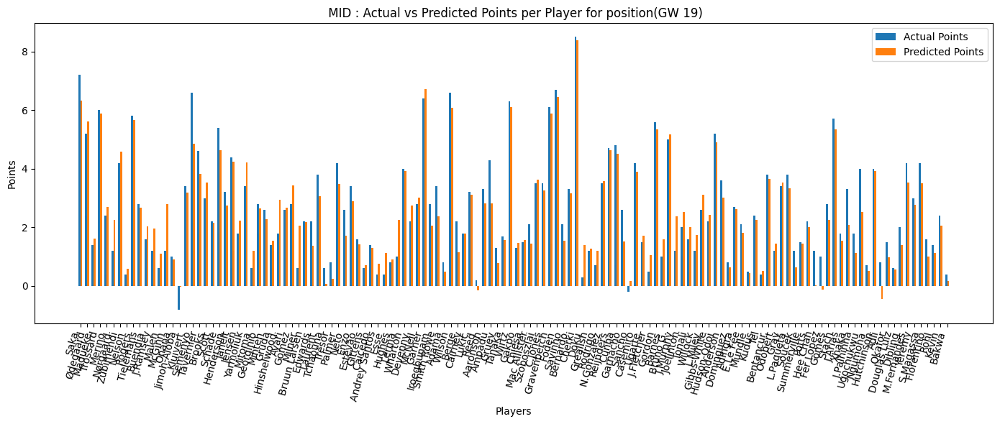

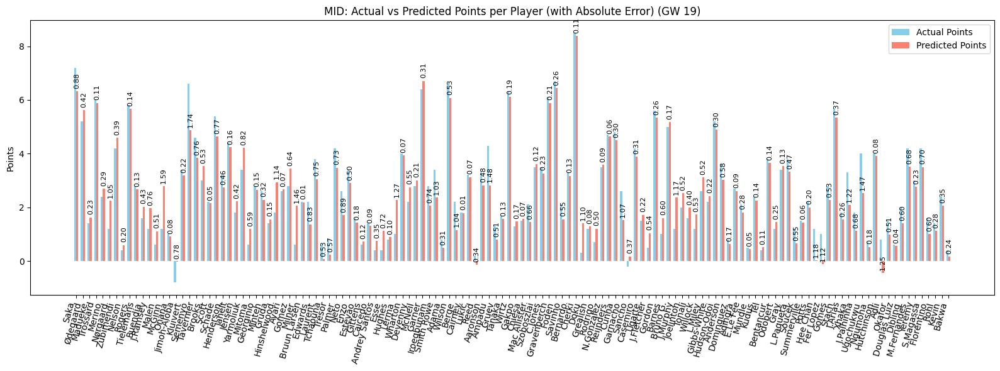

In [49]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


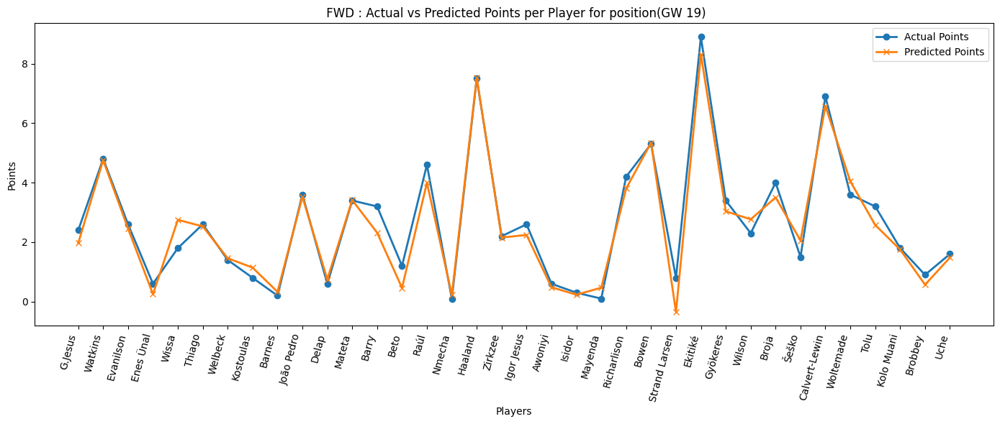

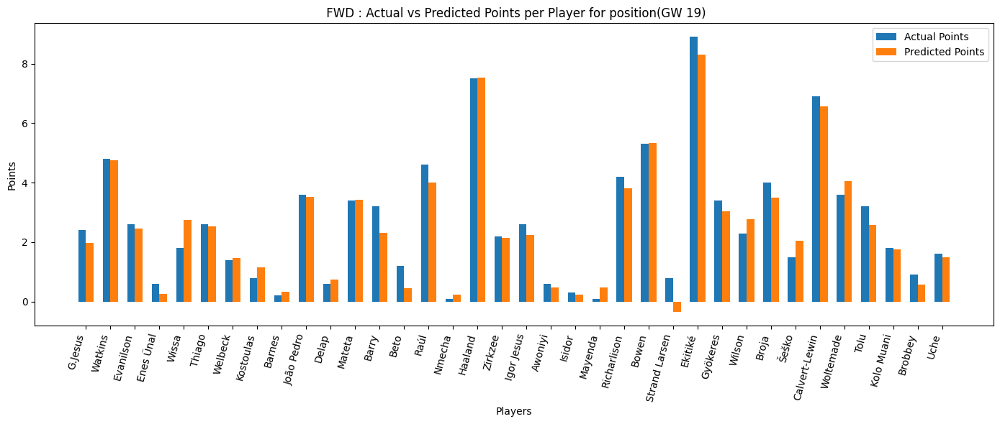

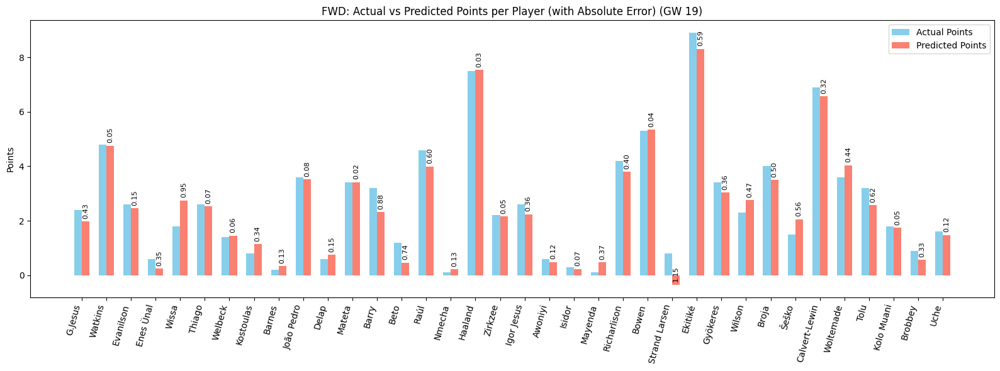

In [50]:
plot_preds(preds_df_19, 'FWD', 19)

### GW 20


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Starting Training...
Epoch 1/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 8.4233 - mae: 2.1886 - mse: 8.1770 - val_loss: 2.4861 - val_mae: 1.1952 - val_mse: 2.2395
Epoch 2/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3385 - mae: 1.1345 - mse: 2.0919 - val_loss: 1.4944 - val_mae: 0.8900 - val_mse: 1.2477
Epoch 3/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2510 - mae: 0.7666 - mse: 1.0043 - val_loss: 1.0850 - val_mae: 0.7239 - val_mse: 0.8386
Epoch 4/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8255 - mae: 0.5836 - mse: 0.5793 - val_loss: 0.8865 - val_mae: 0.6229 - val_mse: 0.6408
Epoch 5/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6403 - mae: 0.4792 - mse: 0.3948 - val_loss: 0.7842 - val_mae: 0.5587 - val_mse: 0.5395
Epoch 6/10
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5228 - mae: 0.4042 - mse: 0.2783 - val_loss: 0.7269 - val_mae: 0.5259 - val_mse: 0.4833
Ep

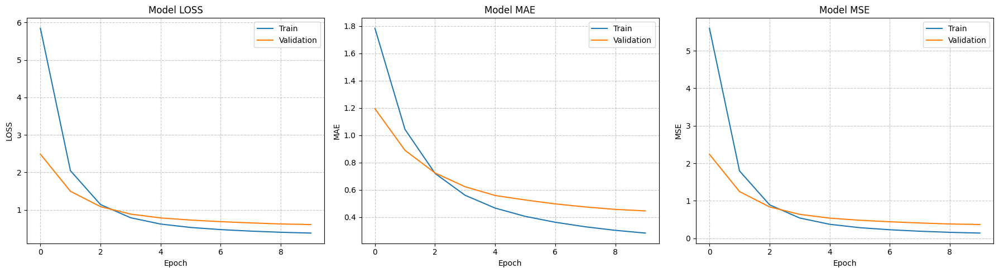


--- Final Test Set Evaluation (GW 20) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Evaluating test set performance...{'loss': 0.5730889439582825, 'mae': 0.43810513615608215, 'mse': 0.3353199064731598}
R²: 0.88395355759212346225
MAE: 0.43810513615608215332
MSE: 0.33531990647315979004
Loss: 0.57308894395828247070

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 20 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       20        Cherki        7.8          8.65       0.96     -1.23
       20    Matheus N.        7.3          7.90       0.96     -1.23
       20        Rogers        6.5          7.21       0.95     -0.96
       20          Rice        3.9          7.15       1.34     -1.61
       20          Saka        6.8          7.03       1.34     -1.61
       20       Collins        6.3          6.64      -0.16      0.42
       20       Haaland        6.7          6.55       0.96  

In [51]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 20)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_20 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_20.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_20 = model_20.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 20) ---")
test_result_20 = model_20.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_20, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_20}")
print(f"R²: {evaluation_metrics['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics['test_loss']:.20f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_20 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_20 = active_data['position'][test_mask]
teams_20 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_20, 'team': teams_20, 'position': position_20}
preds_df_20 = pd.DataFrame(players_preds)

# Results
results_df_20 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_20,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 20 ---")
print(results_df_20.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


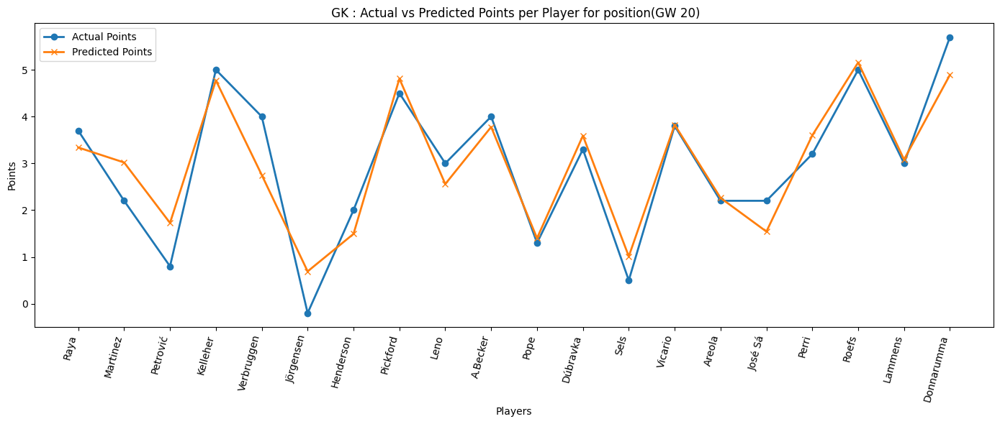

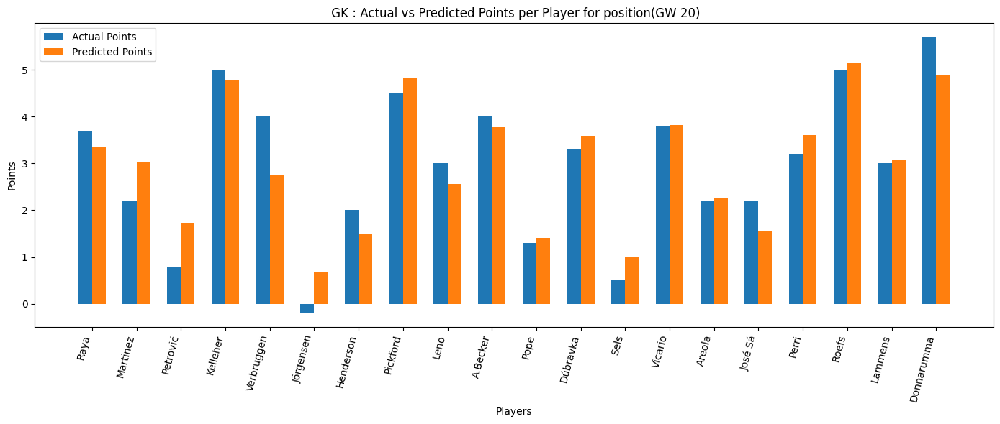

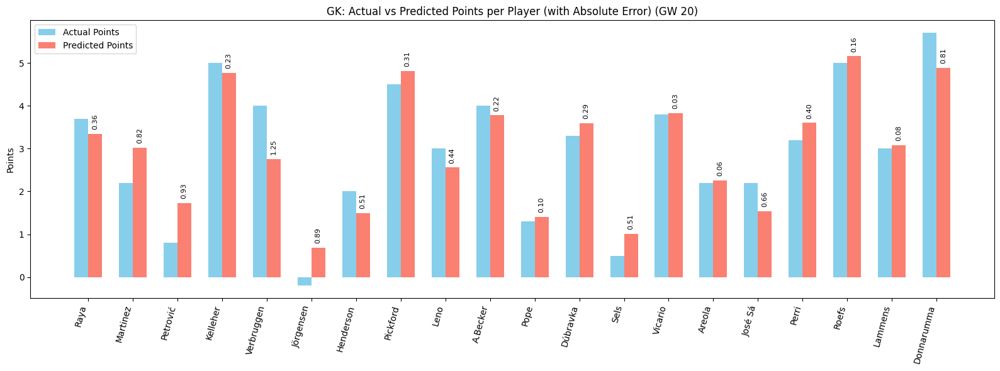

In [52]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


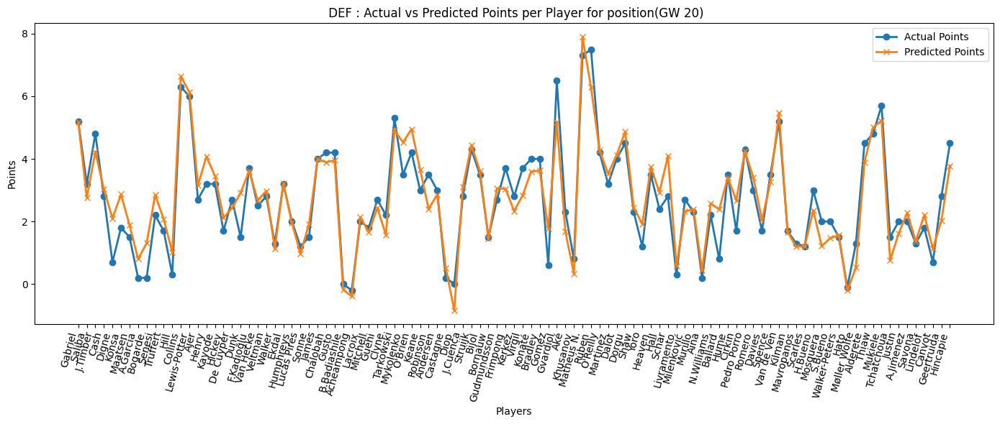

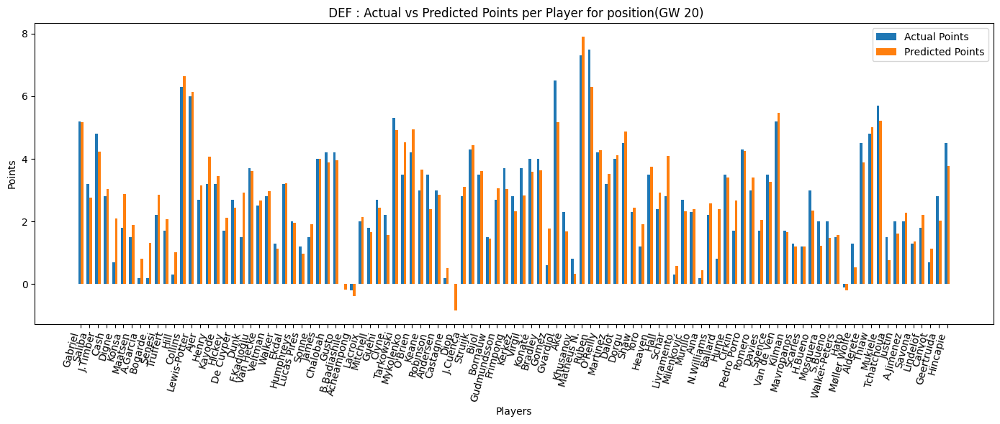

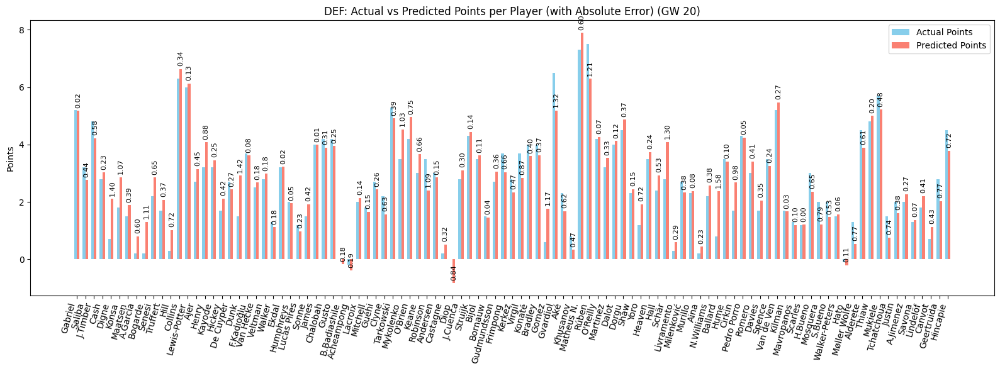

In [53]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


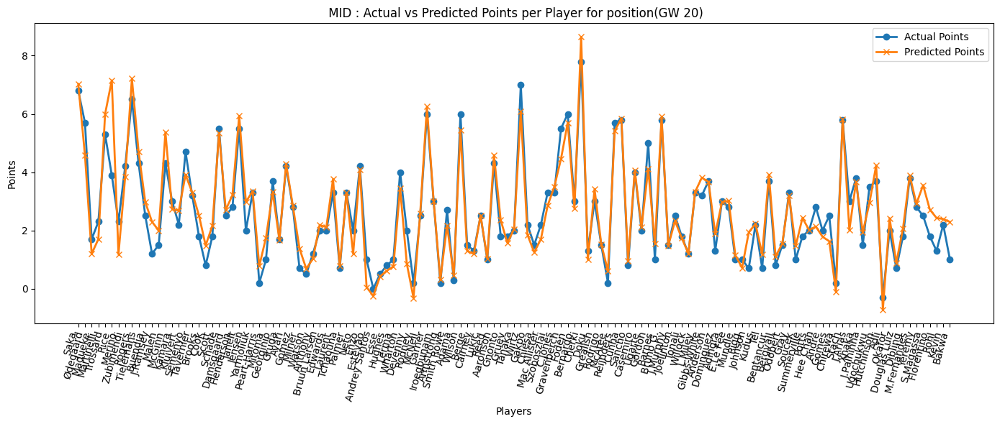

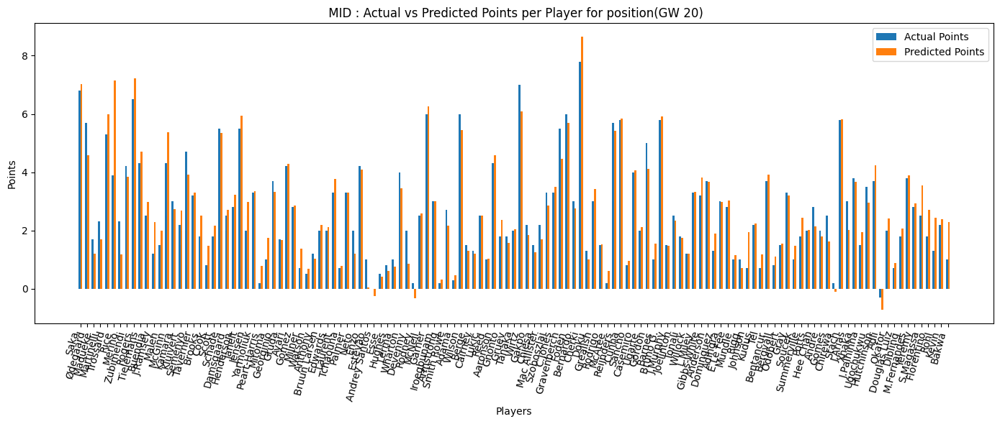

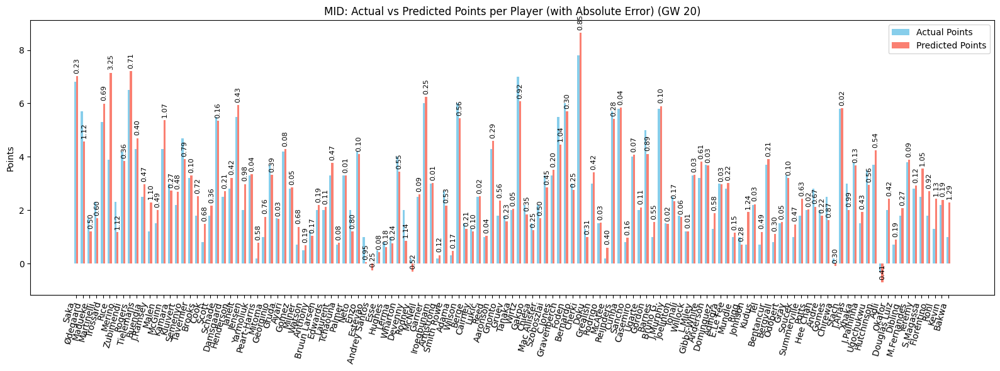

In [54]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


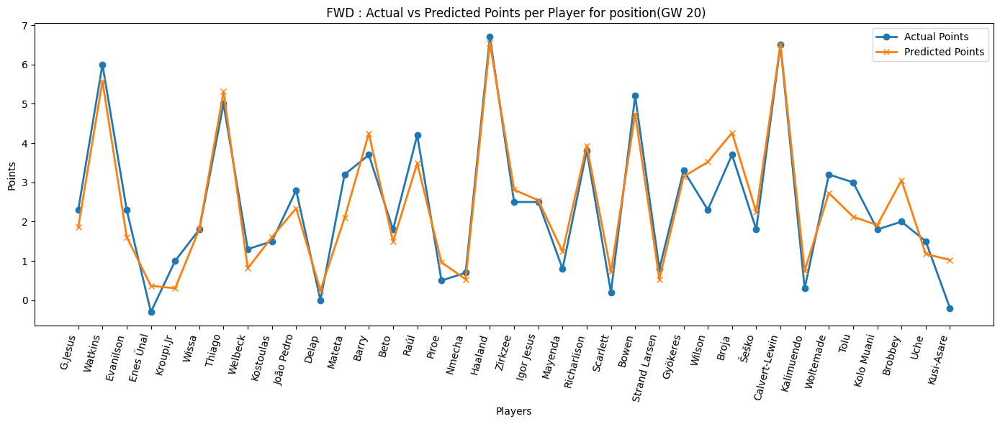

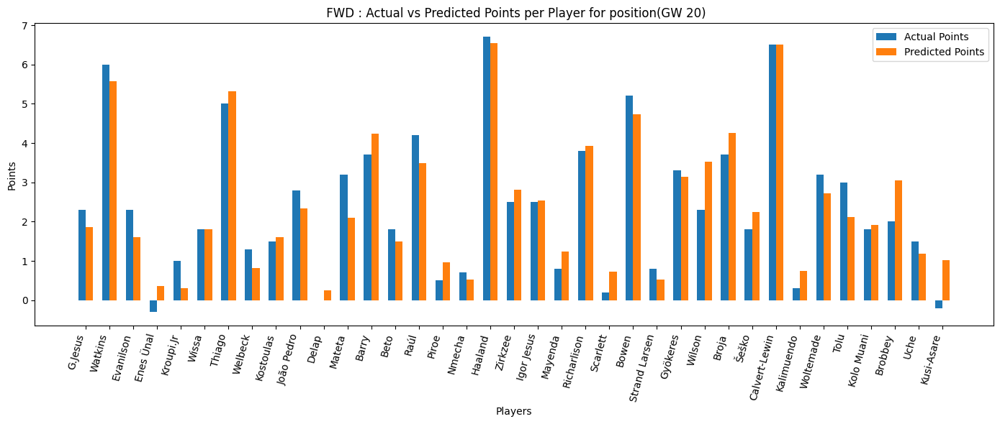

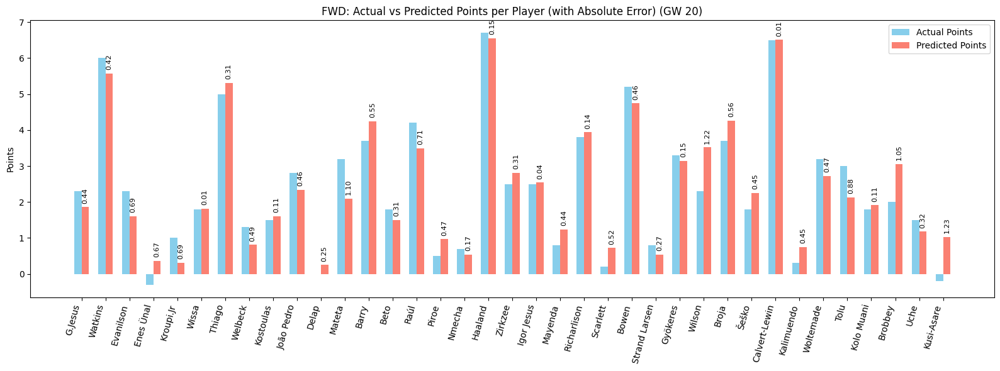

In [55]:
plot_preds(preds_df_20, 'FWD', 20)

### Results


## Current


In [65]:
active_data_[active_data_['round'] == 21]

,fpl_id,round,fpl_name,team_id,was_home,xP_next,xP,selected_by_percent,value,form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
20,1.0,21,Raya,1.0,True,3.3,2.8,33.7,59.0,2.3,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,2.0,21,Arrizabalaga,1.0,True,1.0,0.5,0.4,41.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,4.0,21,Setford,1.0,True,1.0,0.5,0.3,39.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37,5.0,21,Gabriel,1.0,True,5.2,4.7,29.1,67.0,4.2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54,6.0,21,Saliba,1.0,True,3.2,2.7,11.6,59.0,2.2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6629,788.0,21,Kukonki,14.0,False,-0.5,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6630,789.0,21,Merrick,7.0,False,0.0,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6631,790.0,21,Williams-Barnett,18.0,False,0.0,0.0,0.0,45.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6632,791.0,21,Taty,19.0,True,1.9,1.9,0.0,55.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [66]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 21)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Prediction
print("\nGenerating Predictions...")
Y_pred_21 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_21 = active_data['position'][test_mask]
teams_21 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_21, 'team': teams_21, 'position': position_21}
preds_df_21 = pd.DataFrame(players_preds)

# Results
results_df_21 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_21,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 20 ---")
print(results_df_21.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))


Data prepared. X shape: (6634, 218), M shape: (6634, 3), Y shape: (6634, 2)

Generating Predictions...
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

--- Results for Gameweek 20 ---
 Gameweek      Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       21     Haaland        6.3     24.490000       1.36     -1.65
       21      Thiago        4.7     18.270000       0.91     -0.79
       21        Saka        5.7     17.969999       1.12     -1.21
       21 B.Fernandes        3.4     17.870001       1.02     -1.03
       21       Foden        4.0     17.840000       1.36     -1.65
       21     Semenyo        5.2     17.010000       0.47     -0.34
       21      Schade        5.3     15.360000       0.91     -0.79
       21    Bruno G.        4.2     15.150000       1.06     -1.03
       21    Grealish        2.5     14.200000       1.05     -0.89
       21        Enzo        4.2     14.070000       0.55     -0.38


#### Plots


###### GK


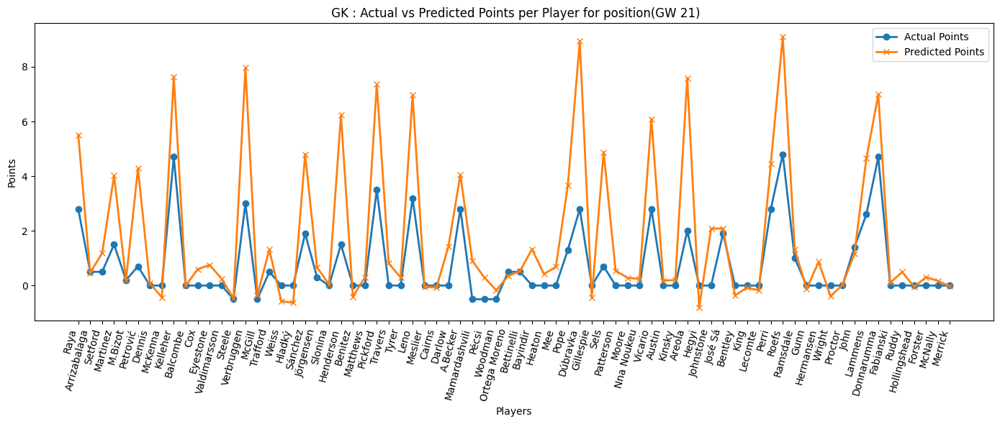

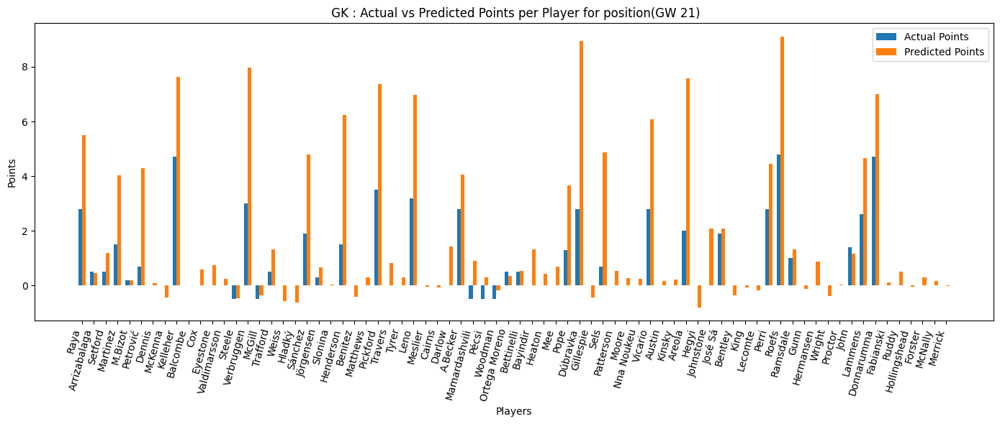

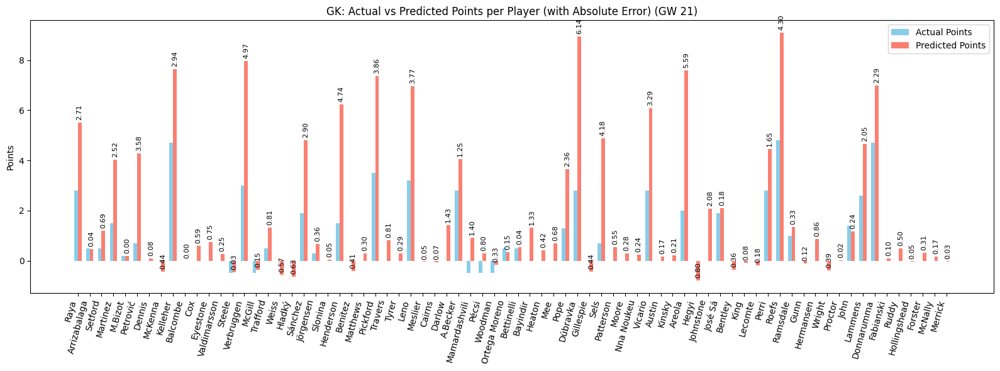

In [60]:
plot_preds(preds_df_21, 'GK', 21)


###### DEF


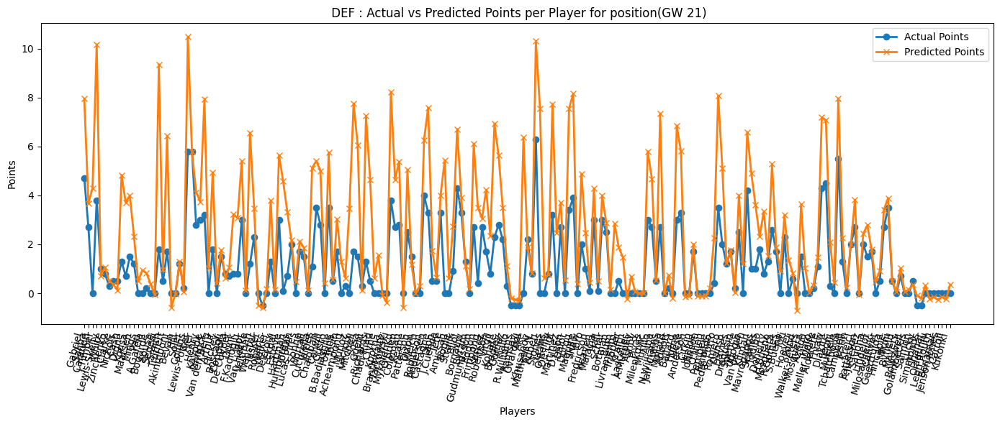

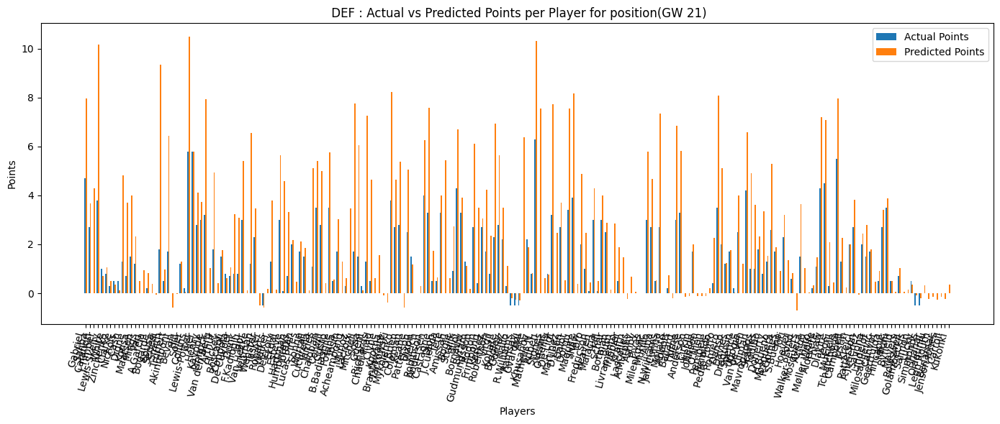

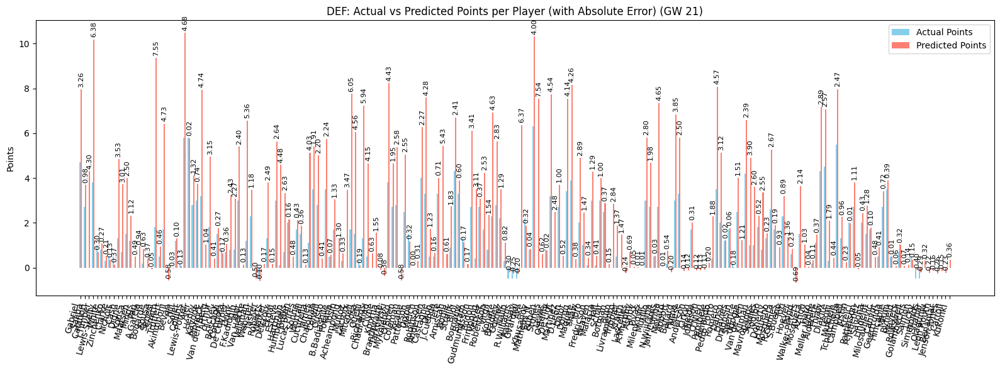

In [61]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


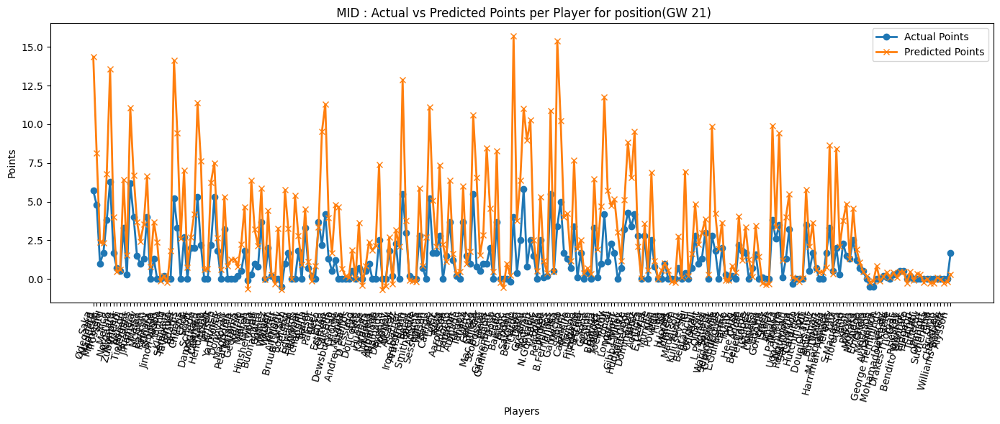

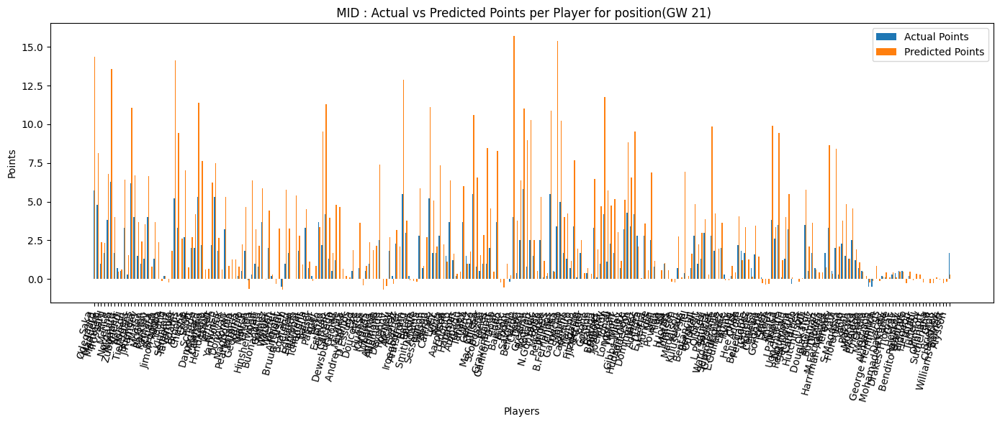

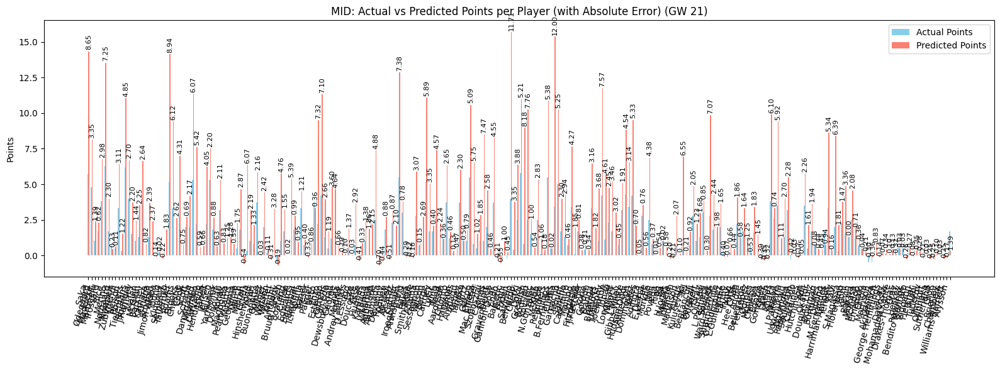

In [62]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


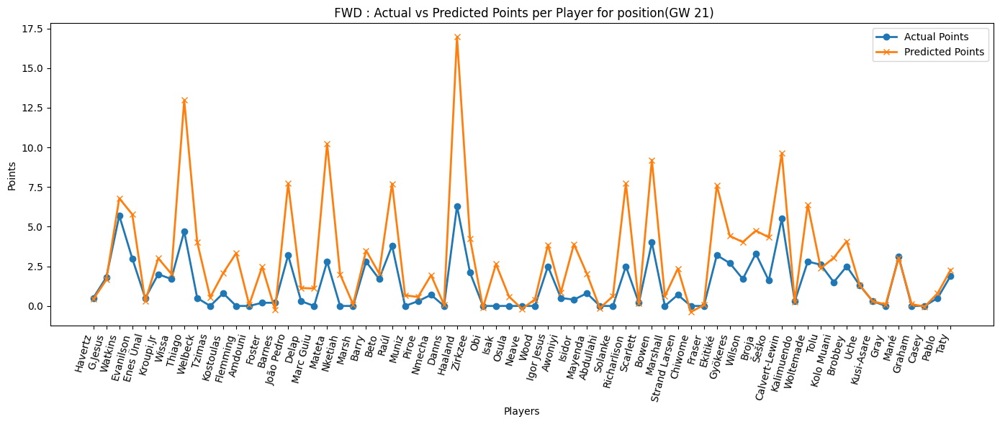

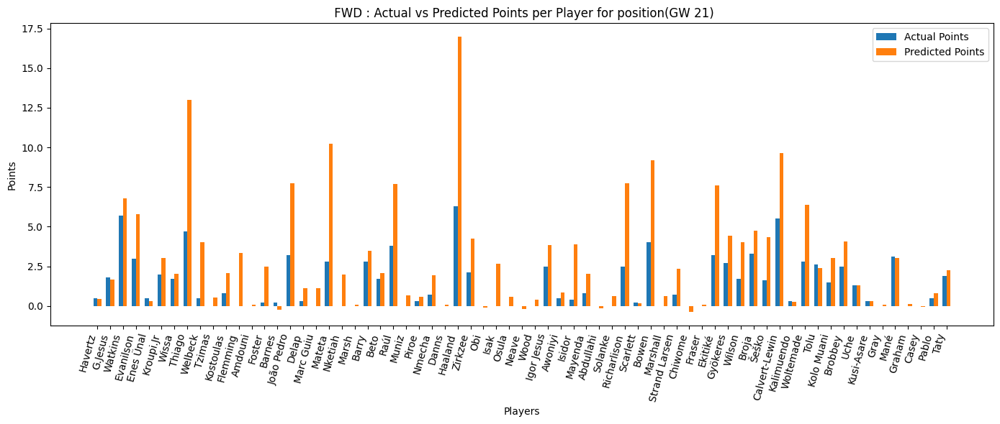

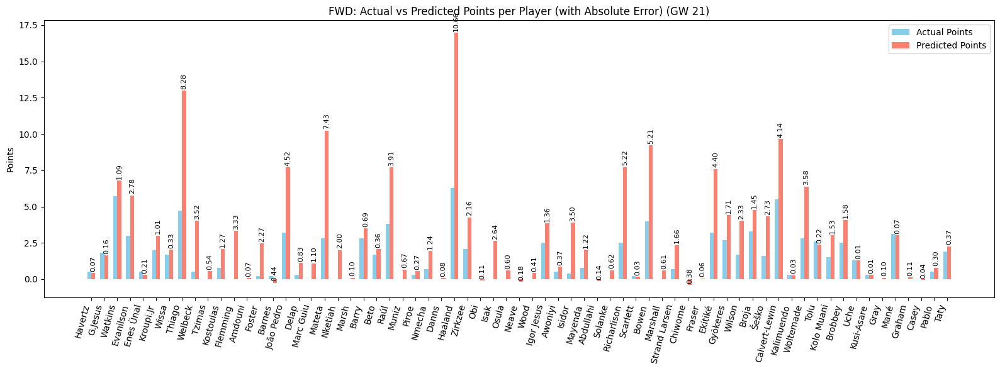

In [63]:
plot_preds(preds_df_21, 'FWD', 21)